In [8]:
import mne
mne.viz.set_browser_backend('matplotlib')
import os.path as op
import pickle
import os 
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import re

In [3]:
from utils import FindAREA, FindExclude, SetUpFolder
from utils import EVENT_ID, FREQ_BAND, PROJECT_PATH, OUT_PATH

In [15]:
SetUpFolder()

In [5]:
TO_EXCLUDE = FindExclude(PROJECT_PATH)
subj = [file for file in os.listdir(PROJECT_PATH + '/data/BIDS') if file[:3] == 'sub']
subj = [s.replace('sub-', '') for s in subj]
subj_excluded = [e.replace('_electrodes.csv', '') for e in TO_EXCLUDE]
subj_included = [s for s in subj if s not in subj_excluded]

AREA, AREA_DICT = FindAREA(project_path=PROJECT_PATH, to_exclude=TO_EXCLUDE, subj_list=subj_included)

# reduced analysis : 
subj_list = ['BJH026','BJH039', 'BJH041','BJH042', 'BJH049', 'BJH050', 'BJH072', 'DA035', 'LL08', 'LL13', 
                     'LL17', 'LL31', 'OS61', 'SD9', 'SLCH018', 'SLCH020', 'SLCH024' ]

## 1. Compute and get the band power

In [11]:
from utils import TFR_pipeline, PlotSingleTFRm

#### 1.1 Generate the TFRm

In [5]:
TFRm_failed = {}

for i, subj in enumerate(subj_list) : 
    print(subj)
    # GENERATE THE MEAN TFR ACCROSS BAND, EVENT AND AREA
    if not os.path.exists(f'{OUT_PATH}/TFR/{subj}_TFRm_bea_LB_0.5_180.0_25_100.p') :
        try : 
            _, _ = TFR_pipeline(subj, area=AREA, tfr_mea_kwargs={'band' : True, 'event': True, 'area':True}, save=True, out_dir=f'{OUT_PATH}/TFR')
        except Exception as e:
            TFRm_failed[subj] = e
    else : 
        print('Already Exists')

    # GENERATE THE MEAN TFR ACCROSS BAND, EVENT
    if not os.path.exists(f'{OUT_PATH}/TFR/{subj}_TFRm_be_LB_0.5_180.0_25_100.p') :
        try : 
            _, _ = TFR_pipeline(subj, area=AREA, tfr_mea_kwargs={'band' : True, 'event': True, 'area':False}, save=True, out_dir = f'{OUT_PATH}/TFR')
            print('success')
        except Exception as e:
            TFRm_failed[subj] = e
    else : 
        print('Already Exists')  

LL08
Already Exists
Already Exists
LL17
Already Exists
Already Exists
IR104
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-IR104/ieeg/sub-IR104_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-IR104/ieeg/sub-IR104_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-IR104/ieeg/sub-IR104_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-IR104/ieeg/sub-IR104_space-fsaverage_electrodes.tsv.
Not fully anonymizing info - keeping his_id, sex, and hand info
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_b

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['DC01', 'DC02', 'DC03', 'DC04', 'XREF', 'EKG', 'E']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 7 misc channels found in montage:
['DC01', 'DC02', 'DC03', 'DC04', 'XREF', 'EKG', 'E']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=215, n_times=335184
    Range : 1763571 ... 2098754 =   1763.571 ...  2098.754 secs
Ready.
Added the following bipolar channels:
LAM1-LAM2, LAM2-LAM3, LAM3-LAM4, LAM4-LAM5, LAM5-LAM6, LAM6-LAM7, LAM7-LAM8, LAM8-LAM9, LAM9-LAM10, LHH1-LHH2, LHH2-LHH3, LHH3-LHH4, LHH4-LHH5, LHH5-LHH6, LHH6-LHH7, LHH7-LHH8, LHH8-LHH9, LHH9-LHH10, LTH1-LTH2, LTH2-LTH3, LTH3-LTH4, LTH4-LTH5, LTH5-LTH6, LTH6-LTH7, LTH7-LTH8, LTH8-LTH9, LTH9-LTH10, LOF1-LOF2, LOF2-LOF3, LOF3-LOF4, LOF4-LOF5, LOF5-LOF6, LOF6-LOF7, LOF7-LOF8, LOF8-LOF9, LOF9-LOF10, LFP1-LFP2, LFP2-LFP3, LFP3-LFP4, LFP4-LFP5, LFP5-LFP6, LFP6-LFP7, LFP7-LFP8, LFP8-LFP9, LFP9-LFP10, LSMA1-LSMA2, LSMA2-LSMA3, LSMA3-LSMA4, LSMA4-LSMA5, LSMA5-LSMA6, LSMA6-LSMA7, LSMA7-LSMA8, LSMA8-LSMA9, LSMA9-LSMA10, LMTG1-LMTG2, LMTG2-LMTG3, LMTG3-LMTG4, LMTG4-LMTG5, LMTG5-LMTG6, LMTG6-LMTG7, LMTG7-LMTG8, LMTG8-LMTG9, LMTG9-LMTG10, LSTG1-LSTG2, LSTG2-LSTG3, LSTG3-LSTG4, LS

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 98 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might need to alter reject/flat-criteria or drop bad channels to avoid this. You can use Epochs.plot_drop_log() to see which channels are responsible for the dropping of epochs.
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:351: RuntimeWarning: epochs._get_data() can't run because this Epochs-object is empty. You might want to check Epochs.drop_log or Epochs.plot_drop_log() to see why epochs were dropped.
  data_mean = np.mean(epochs.get_data(), axis=(0,2), keepdims=True)
/users/barbara/miniforge3/envs/mne_iEEG/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/users/barbara/miniforge3/envs/mne_iEEG/lib/python3.10/site-packages/numpy/_core/_methods.py:137: RuntimeWarning: invalid value encountered in 

Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-IR104/ieeg/sub-IR104_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-IR104/ieeg/sub-IR104_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-IR104/ieeg/sub-IR104_space-fsaverage_electrodes.tsv.
Not fully anonymizing info - keeping his_id, sex, and hand info
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_48'), np.str_('learning_bach_49'), np.str_('learning_bach_50'), np.str_('learning_bach_990'), np.str_('localizer_1'), np.str_('localizer_2'), np.str_('localizer_3'), np.str_('maintenance_1'), np.str_('maintenance_101'), np.str_('maintenance_102'), np.str_('maintenance_103'), np.str_('maintenance_2'

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['DC01', 'DC02', 'DC03', 'DC04', 'XREF', 'EKG', 'E']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 7 misc channels found in montage:
['DC01', 'DC02', 'DC03', 'DC04', 'XREF', 'EKG', 'E']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=215, n_times=335184
    Range : 1763571 ... 2098754 =   1763.571 ...  2098.754 secs
Ready.
Added the following bipolar channels:
LAM1-LAM2, LAM2-LAM3, LAM3-LAM4, LAM4-LAM5, LAM5-LAM6, LAM6-LAM7, LAM7-LAM8, LAM8-LAM9, LAM9-LAM10, LHH1-LHH2, LHH2-LHH3, LHH3-LHH4, LHH4-LHH5, LHH5-LHH6, LHH6-LHH7, LHH7-LHH8, LHH8-LHH9, LHH9-LHH10, LTH1-LTH2, LTH2-LTH3, LTH3-LTH4, LTH4-LTH5, LTH5-LTH6, LTH6-LTH7, LTH7-LTH8, LTH8-LTH9, LTH9-LTH10, LOF1-LOF2, LOF2-LOF3, LOF3-LOF4, LOF4-LOF5, LOF5-LOF6, LOF6-LOF7, LOF7-LOF8, LOF8-LOF9, LOF9-LOF10, LFP1-LFP2, LFP2-LFP3, LFP3-LFP4, LFP4-LFP5, LFP5-LFP6, LFP6-LFP7, LFP7-LFP8, LFP8-LFP9, LFP9-LFP10, LSMA1-LSMA2, LSMA2-LSMA3, LSMA3-LSMA4, LSMA4-LSMA5, LSMA5-LSMA6, LSMA6-LSMA7, LSMA7-LSMA8, LSMA8-LSMA9, LSMA9-LSMA10, LMTG1-LMTG2, LMTG2-LMTG3, LMTG3-LMTG4, LMTG4-LMTG5, LMTG5-LMTG6, LMTG6-LMTG7, LMTG7-LMTG8, LMTG8-LMTG9, LMTG9-LMTG10, LSTG1-LSTG2, LSTG2-LSTG3, LSTG3-LSTG4, LS

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 98 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might need to alter reject/flat-criteria or drop bad channels to avoid this. You can use Epochs.plot_drop_log() to see which channels are responsible for the dropping of epochs.
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:351: RuntimeWarning: epochs._get_data() can't run because this Epochs-object is empty. You might want to check Epochs.drop_log or Epochs.plot_drop_log() to see why epochs were dropped.
  data_mean = np.mean(epochs.get_data(), axis=(0,2), keepdims=True)
/users/barbara/miniforge3/envs/mne_iEEG/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/users/barbara/miniforge3/envs/mne_iEEG/lib/python3.10/site-packages/numpy/_core/_methods.py:137: RuntimeWarning: invalid value encountered in 

Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS72/ieeg/sub-OS72_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS72/ieeg/sub-OS72_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS72/ieeg/sub-OS72_space-fsaverage_electrodes.tsv.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_48'), np.str_('learning_bach_49'), np.str_('learning_bach_50'), np.str_('learning_bach_990'), np.str_('localizer_1'), np.str_('localizer_2'), np.str_('localizer_3'), np.str_('maintenance_1'), np.str_('maintenance_101'), np.str_('maintenance_102'), np.str_('maintenance_103'), np.str_('maintenance_2'), np.str_('maintenance_3'), np.str_('maintenance_49'), np.str_('maint

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 96 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS72/ieeg/sub-OS72_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS72/ieeg/sub-OS72_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS72/ieeg/sub-OS72_space-fsaverage_electrodes.tsv.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_48'), np.str_('learning_bach_49'), np.str_('learning_bach_50'), np.str_('learning_bach_990'), np.str_('localizer_1'), np.str_('localizer_2'), np.str_('localizer_3'), np.str_('maintenance_1'), np.str_('maintenance_101'), np.str_('maintenance_102'), np.str_('maintenance_103'), np.str_('maintenance_2'), np.str_('maintenance_3'), np.str_('maintenance_49'), np.str_('maint

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 96 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

BJH069
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH069/ieeg/sub-BJH069_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH069/ieeg/sub-BJH069_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH069/ieeg/sub-BJH069_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH069/ieeg/sub-BJH069_space-fsaverage_electrodes.tsv.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_32'), np.str_('learning_bach_49'), np.str_('learning_bach_50'), np.str_('learning_bach_506')

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['REF1', 'REF2', 'EMPTY', 'EMPTY_208', 'EMPTY_209', 'EMPTY_210', 'EMPTY_211', 'EMPTY_212', 'EMPTY_213', 'EMPTY_214', 'EMPTY_215', 'EMPTY_216', 'EMPTY_217', 'EMPTY_218', 'EMPTY_219', 'EMPTY_220', 'EMPTY_221', 'EMPTY_222', 'EMPTY_223', 'EMPTY_224', 'EMPTY_225', 'EMPTY_226', 'EMPTY_227', 'EMPTY_228', 'EMPTY_229', 'EMPTY_230', 'EMPTY_231', 'FP1', 'F3', 'C3', 'P3', 'O1', 'FP2', 'F4', 'C4', 'P4', 'O2', 'F7', 'T7', 'P7', 'F8', 'T8', 'P8', 'F9', 'F10', 'FPZ', 'FZ', 'CZ', 'PZ', 'OZ', 'EKG1', 'EKG2']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 52 misc channels found in montage:
['REF1', 'REF2', 'EMPTY', 'EMPTY_208', 'EMPTY_209', 'EMPTY_210', 'EMPTY_211', 'EMPTY_212', 'EMPTY_213', 'EMPTY_214', 'EMPTY_215', 'EMPTY_216', 'EMPTY_217', 'EMPTY_218', 'EMPTY_219', 'EMPTY_220', 'EMPTY_221', 'EMPTY_222', 'EMPT

sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=190, n_times=767421
    Range : 20400 ... 787820 =     10.200 ...   393.910 secs
Ready.
Added the following bipolar channels:
AL1-AL2, AL2-AL3, AL3-AL4, AL4-AL5, AL5-AL6, AL6-AL7, AL7-AL8, AL8-AL9, AL9-AL10, AL10-AL11, AL11-AL12, AL12-AL13, AL13-AL14, AL14-AL15, BL1-BL2, BL2-BL3, BL3-BL4, BL4-BL5, BL5-BL6, CL1-CL2, CL2-CL3, CL3-CL4, CL4-CL5, CL5-CL6, CL6-CL7, CL7-CL8, CL8-CL9, CL9-CL10, CL10-CL11, CL11-CL12, CL12-CL13, CL13-CL14, CL14-CL15, DAL1-DAL2, DAL2-DAL3, DAL3-DAL4, DAL4-DAL5, DAL5-DAL6, DAL6-DAL7, DAL7-DAL8, DAL8-DAL9, DAL9-DAL10, DAL10-DAL11, DAL11-DAL12, DBL1-DBL2, DBL2-DBL3, DBL3-DBL4, DBL4-DBL5, DBL5-DBL6, DBL6-DBL7, DBL7-DBL8, DBL8-DBL9, DBL9-DBL10, DBL10-DBL11, DBL11-DBL12, EL1-EL2, EL2-EL3, EL3-EL4, EL4-EL5, EL5-EL6, EL6-EL7, EL7-EL8, EL8-EL9, EL9-EL10, EL10-EL11, EL11-EL12, FL1-FL2, FL2-FL3, FL3-FL4, FL4-FL5, FL5-FL6, GL1-GL2, GL2-GL3, GL3-GL4, GL4-GL5, GL5-GL6, GL6-GL7, GL7-GL

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 4 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

SLCH020
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH020/ieeg/sub-SLCH020_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH020/ieeg/sub-SLCH020_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH020/ieeg/sub-SLCH020_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH020/ieeg/sub-SLCH020_space-fsaverage_electrodes.tsv.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_162'), np.str_('learning_bach_20'), np.str_('learning_bach_32'), np.str_('learning_bach_49'), np.str_('learning_

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['NA', 'NA_2', 'NA_3', 'NA_4', 'REF1', 'REF2', 'A63', 'A64', 'B59', 'B60', 'B61', 'B62', 'B63', 'B64', 'C57', 'C58', 'C59', 'C60', 'C61', 'C62', 'C63', 'C64']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 22 misc channels found in montage:
['NA', 'NA_2', 'NA_3', 'NA_4', 'REF1', 'REF2', 'A63', 'A64', 'B59', 'B60', 'B61', 'B62', 'B63', 'B64', 'C57', 'C58', 'C59', 'C60', 'C61', 'C62', 'C63', 'C64']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=155, n_times=688999
    Range : 8802 ... 697800 =      4.401 ...   348.900 secs
Ready.
Added the following bipolar channels:
A`1-A`2, A`2-A`3, A`3-A`4, A`4-A`5, A`5-A`6, A`6-A`7, A`7-A`8, A`8-A`9, A`9-A`10, B`1-B`2, B`2-B`3, B`3-B`4, B`4-B`5, B`5-B`6, B`6-B`7, B`7-B`8, B`8-B`9, B`9-B`10, B`10-B`11, B`11-B`12, C`1-C`2, C`2-C`3, C`3-C`4, C`4-C`5, C`5-C`6, C`6-C`7, C`7-C`8, C`8-C`9, C`9-C`10, C`10-C`11, C`11-C`12, C`12-C`13, C`13-C`14, C`14-C`15, C`15-C`16, D`1-D`2, D`2-D`3, D`3-D`4, D`4-D`5, D`5-D`6, D`6-D`7, D`7-D`8, D`8-D`9, D`9-D`10, E`1-E`2, E`2-E`3, E`3-E`4, E`4-E`5, E`5-E`6, E`6-E`7, E`7-E`8, F`1-F`2, F`2-F`3, F`3-F`4, F`4-F`5, F`5-F`6, F`6-F`7, F`7-F`8, F`8-F`9, F`9-F`10, F`10-F`11, F`11-F`12, F`12-F`13, F`13-F`14, F`14-F`15, F`15-F`16, G`1-G`2, G`2-G`3, G`3-G`4, G`4-G`5, G`5-G`6, G`6-G`7, G`7-G`8, G`8-G`9, G`9-G`10, G`10-G`11, G`11-G`12, H`1-H`2, H`2-H`3, H`3-H`4, H`4-H`5, H`5-H`6, H`6-H

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 2 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH020/ieeg/sub-SLCH020_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH020/ieeg/sub-SLCH020_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH020/ieeg/sub-SLCH020_space-fsaverage_electrodes.tsv.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_162'), np.str_('learning_bach_20'), np.str_('learning_bach_32'), np.str_('learning_bach_49'), np.str_('learning_bach_50'), np.str_('learning_bach_506'), np.str_('learning_bach_990'), np.str_('localizer_1'), np.str_('localizer_2'), np.str_('localizer_3'), np.str_('localizer_32'), np.str_('localizer_49'), np.str_('localizer_501'), np.str_('maintenan

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['NA', 'NA_2', 'NA_3', 'NA_4', 'REF1', 'REF2', 'A63', 'A64', 'B59', 'B60', 'B61', 'B62', 'B63', 'B64', 'C57', 'C58', 'C59', 'C60', 'C61', 'C62', 'C63', 'C64']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 22 misc channels found in montage:
['NA', 'NA_2', 'NA_3', 'NA_4', 'REF1', 'REF2', 'A63', 'A64', 'B59', 'B60', 'B61', 'B62', 'B63', 'B64', 'C57', 'C58', 'C59', 'C60', 'C61', 'C62', 'C63', 'C64']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=155, n_times=688999
    Range : 8802 ... 697800 =      4.401 ...   348.900 secs
Ready.
Added the following bipolar channels:
A`1-A`2, A`2-A`3, A`3-A`4, A`4-A`5, A`5-A`6, A`6-A`7, A`7-A`8, A`8-A`9, A`9-A`10, B`1-B`2, B`2-B`3, B`3-B`4, B`4-B`5, B`5-B`6, B`6-B`7, B`7-B`8, B`8-B`9, B`9-B`10, B`10-B`11, B`11-B`12, C`1-C`2, C`2-C`3, C`3-C`4, C`4-C`5, C`5-C`6, C`6-C`7, C`7-C`8, C`8-C`9, C`9-C`10, C`10-C`11, C`11-C`12, C`12-C`13, C`13-C`14, C`14-C`15, C`15-C`16, D`1-D`2, D`2-D`3, D`3-D`4, D`4-D`5, D`5-D`6, D`6-D`7, D`7-D`8, D`8-D`9, D`9-D`10, E`1-E`2, E`2-E`3, E`3-E`4, E`4-E`5, E`5-E`6, E`6-E`7, E`7-E`8, F`1-F`2, F`2-F`3, F`3-F`4, F`4-F`5, F`5-F`6, F`6-F`7, F`7-F`8, F`8-F`9, F`9-F`10, F`10-F`11, F`11-F`12, F`12-F`13, F`13-F`14, F`14-F`15, F`15-F`16, G`1-G`2, G`2-G`3, G`3-G`4, G`4-G`5, G`5-G`6, G`6-G`7, G`7-G`8, G`8-G`9, G`9-G`10, G`10-G`11, G`11-G`12, H`1-H`2, H`2-H`3, H`3-H`4, H`4-H`5, H`5-H`6, H`6-H

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 2 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

SLCH006
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH006/ieeg/sub-SLCH006_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH006/ieeg/sub-SLCH006_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH006/ieeg/sub-SLCH006_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH006/ieeg/sub-SLCH006_space-fsaverage_electrodes.tsv.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_32'), np.str_('learning_bach_49'), np.str_('learning_bach_50'), np.str_('learning_b

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['REF1', 'REF2', 'Fp1', 'Fp2', 'T7', 'C3_234', 'Cz', 'C4_236', 'T8', 'O1_238', 'O2_242']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 11 misc channels found in montage:
['REF1', 'REF2', 'Fp1', 'Fp2', 'T7', 'C3_234', 'Cz', 'C4_236', 'T8', 'O1_238', 'O2_242']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=227, n_times=666405
    Range : 20400 ... 686804 =     10.200 ...   343.402 secs
Ready.
Added the following bipolar channels:
A1-A2, A2-A3, A3-A4, A4-A5, A5-A6, A6-A7, A7-A8, A8-A9, A9-A10, A10-A11, A11-A12, A12-A13, A13-A14, B1-B2, B2-B3, B3-B4, B4-B5, B5-B6, B6-B7, B7-B8, B8-B9, B9-B10, B10-B11, B11-B12, B12-B13, C1-C2, C2-C3, C3-C4, C4-C5, C5-C6, C6-C7, C7-C8, C8-C9, C9-C10, C10-C11, C11-C12, C12-C13, D1-D2, D2-D3, D3-D4, D4-D5, D5-D6, D6-D7, D7-D8, D8-D9, D9-D10, D10-D11, D11-D12, E1-E2, E2-E3, E3-E4, E4-E5, E5-E6, E6-E7, E7-E8, E8-E9, E9-E10, E10-E11, E11-E12, F1-F2, F2-F3, F3-F4, F4-F5, F5-F6, F6-F7, F7-F8, F8-F9, F9-F10, F10-F11, F11-F12, G1-G2, G2-G3, G3-G4, G4-G5, G5-G6, G6-G7, G7-G8, G8-G9, G9-G10, G10-G11, G11-G12, H1-H2, H2-H3, H3-H4, H4-H5, H5-H6, H6-H7, H7-H8, H8-H9, H9-H10, H10-H11, H11-H12, i1-i2, i2-i3, i3-i4, i4-i5, i5-i6, i6-i7, i7-i8, i8-i9, i9-i10, i10-i11, i11-i12, i12-i1

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 5 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-SLCH006/ieeg/sub-SLCH006_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
BJH045
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH045/ieeg/sub-BJH045_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH045/ieeg/sub-BJH045_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH045/ieeg/sub-BJH045_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH045/ieeg/sub-BJH045_space-fsaverage_electrodes.tsv.
NOTE: pick_types() is 

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['REF1', 'REF2', 'EMPTY', 'EMPTY_230', 'EMPTY_231', 'FP1', 'F3', 'C3', 'P3', 'O1', 'FP2', 'F4', 'C4', 'P4', 'O2', 'F7', 'T7', 'P7', 'F8', 'T8', 'P8', 'F9', 'F10', 'FPZ', 'FZ', 'CZ', 'PZ', 'OZ', 'EKG1', 'EKG2']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 30 misc channels found in montage:
['REF1', 'REF2', 'EMPTY', 'EMPTY_230', 'EMPTY_231', 'FP1', 'F3', 'C3', 'P3', 'O1', 'FP2', 'F4', 'C4', 'P4', 'O2', 'F7', 'T7', 'P7', 'F8', 'T8', 'P8', 'F9', 'F10', 'FPZ', 'FZ', 'CZ', 'PZ', 'OZ', 'EKG1', 'EKG2']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=207, n_times=681951
    Range : 20400 ... 702350 =     10.200 ...   351.175 secs
Ready.
Added the following bipolar channels:
AR1-AR2, AR2-AR3, AR3-AR4, AR4-AR5, AR5-AR6, AR6-AR7, AR7-AR8, BR1-BR2, BR2-BR3, BR3-BR4, BR4-BR5, BR5-BR6, BR6-BR7, BR7-BR8, CR1-CR2, CR2-CR3, CR3-CR4, CR4-CR5, CR5-CR6, CR6-CR7, CR7-CR8, CR8-CR9, CR9-CR10, CR10-CR11, CR11-CR12, DR1-DR2, DR2-DR3, DR3-DR4, DR4-DR5, DR5-DR6, DR6-DR7, DR7-DR8, DR8-DR9, DR9-DR10, DR10-DR11, DR11-DR12, DR12-DR13, DR13-DR14, DR14-DR15, ER1-ER2, ER2-ER3, ER3-ER4, ER4-ER5, ER5-ER6, ER6-ER7, ER7-ER8, ER8-ER9, ER9-ER10, ER10-ER11, ER11-ER12, ER12-ER13, ER13-ER14, ER14-ER15, FR1-FR2, FR2-FR3, FR3-FR4, FR4-FR5, FR5-FR6, FR6-FR7, FR7-FR8, FR8-FR9, FR9-FR10, GR1-GR2, GR2-GR3, GR3-GR4, GR4-GR5, GR5-GR6, GR6-GR7, GR7-GR8, GR8-GR9, GR9-GR10, GR10-GR11, GR11-GR12, HR1-HR2, HR2-HR3, HR3-HR4, HR4-HR5, HR5-HR6, HR6-HR7, HR7-HR8, HR8-HR9, HR9-HR10, HR10-HR1

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 4 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH045/ieeg/sub-BJH045_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH045/ieeg/sub-BJH045_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH045/ieeg/sub-BJH045_space-fsaverage_electrodes.tsv.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_32'), np.str_('learning_bach_49'), np.str_('learning_bach_50'), np.str_('learning_bach_506'), np.str_('learning_bach_51'), np.str_('learning_bach_990'), np.str_('localizer_1'), np.str_('localizer_2'), np.str_('localizer_3'), np.str_('localizer_32'), np.str_('localizer_501'), np.str_('maintenance_1'), np.str_('maintenance_101'), np.str_('maintenance_102'),

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['REF1', 'REF2', 'EMPTY', 'EMPTY_230', 'EMPTY_231', 'FP1', 'F3', 'C3', 'P3', 'O1', 'FP2', 'F4', 'C4', 'P4', 'O2', 'F7', 'T7', 'P7', 'F8', 'T8', 'P8', 'F9', 'F10', 'FPZ', 'FZ', 'CZ', 'PZ', 'OZ', 'EKG1', 'EKG2']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 30 misc channels found in montage:
['REF1', 'REF2', 'EMPTY', 'EMPTY_230', 'EMPTY_231', 'FP1', 'F3', 'C3', 'P3', 'O1', 'FP2', 'F4', 'C4', 'P4', 'O2', 'F7', 'T7', 'P7', 'F8', 'T8', 'P8', 'F9', 'F10', 'FPZ', 'FZ', 'CZ', 'PZ', 'OZ', 'EKG1', 'EKG2']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=207, n_times=681951
    Range : 20400 ... 702350 =     10.200 ...   351.175 secs
Ready.
Added the following bipolar channels:
AR1-AR2, AR2-AR3, AR3-AR4, AR4-AR5, AR5-AR6, AR6-AR7, AR7-AR8, BR1-BR2, BR2-BR3, BR3-BR4, BR4-BR5, BR5-BR6, BR6-BR7, BR7-BR8, CR1-CR2, CR2-CR3, CR3-CR4, CR4-CR5, CR5-CR6, CR6-CR7, CR7-CR8, CR8-CR9, CR9-CR10, CR10-CR11, CR11-CR12, DR1-DR2, DR2-DR3, DR3-DR4, DR4-DR5, DR5-DR6, DR6-DR7, DR7-DR8, DR8-DR9, DR9-DR10, DR10-DR11, DR11-DR12, DR12-DR13, DR13-DR14, DR14-DR15, ER1-ER2, ER2-ER3, ER3-ER4, ER4-ER5, ER5-ER6, ER6-ER7, ER7-ER8, ER8-ER9, ER9-ER10, ER10-ER11, ER11-ER12, ER12-ER13, ER13-ER14, ER14-ER15, FR1-FR2, FR2-FR3, FR3-FR4, FR4-FR5, FR5-FR6, FR6-FR7, FR7-FR8, FR8-FR9, FR9-FR10, GR1-GR2, GR2-GR3, GR3-GR4, GR4-GR5, GR5-GR6, GR6-GR7, GR7-GR8, GR8-GR9, GR9-GR10, GR10-GR11, GR11-GR12, HR1-HR2, HR2-HR3, HR3-HR4, HR4-HR5, HR5-HR6, HR6-HR7, HR7-HR8, HR8-HR9, HR9-HR10, HR10-HR1

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 4 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

LL14
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-LL14/ieeg/sub-LL14_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-LL14/ieeg/sub-LL14_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-LL14/ieeg/sub-LL14_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-LL14/ieeg/sub-LL14_space-fsaverage_electrodes.tsv.
Not fully anonymizing info - keeping his_id, sex, and hand info
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_32'), np.str_('learning_bach_49'), np.str_('le

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['DC1', 'DC2', 'DC7', 'DC8', 'EEG EKG']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 5 misc channels found in montage:
['DC1', 'DC2', 'DC7', 'DC8', 'EEG EKG']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=109, n_times=309225
    Range : 1433753 ... 1742977 =   1400.149 ...  1702.126 secs
Ready.
Added the following bipolar channels:
EEG LA1-EEG LA2, EEG LA2-EEG LA3, EEG LA3-EEG LA4, EEG LA4-EEG LA5, EEG LA5-EEG LA6, EEG LA6-EEG LA7, EEG LA7-EEG LA8, EEG LH1-EEG LH2, EEG LH2-EEG LH3, EEG LH3-EEG LH4, EEG LH4-EEG LH5, EEG LH5-EEG LH6, EEG LH6-EEG LH7, EEG LH7-EEG LH8, EEG LHP1-EEG LHP2, EEG LHP2-EEG LHP3, EEG LHP3-EEG LHP4, EEG LHP4-EEG LHP5, EEG LHP5-EEG LHP6, EEG LHP6-EEG LHP7, EEG LHP7-EEG LHP8, EEG LOF1-EEG LOF2, EEG LOF2-EEG LOF3, EEG LOF3-EEG LOF4, EEG LOF4-EEG LOF5, EEG LOF5-EEG LOF6, EEG LOF6-EEG LOF7, EEG LOF7-EEG LOF8, EEG LOF8-EEG LOF9, EEG LOF9-EEG LOF10, EEG LOF10-EEG LOF11, EEG LOF11-EEG LOF12, EEG LAC1-EEG LAC2, EEG LAC2-EEG LAC3, EEG LAC3-EEG LAC4, EEG LAC4-EEG LAC5, EEG LAC5-EEG LAC6, EEG LAC6-EEG LAC7, EEG LAC7-EEG LAC8, EEG LAC8-EEG LAC9, EEG LAC9-EEG LAC10, EEG LPC1-EEG LPC2, E

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 98 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-LL14/ieeg/sub-LL14_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-LL14/ieeg/sub-LL14_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-LL14/ieeg/sub-LL14_space-fsaverage_electrodes.tsv.
Not fully anonymizing info - keeping his_id, sex, and hand info
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_32'), np.str_('learning_bach_49'), np.str_('learning_bach_50'), np.str_('learning_bach_506'), np.str_('learning_bach_990'), np.str_('localizer_1'), np.str_('localizer_2'), np.str_('localizer_3'), np.str_('localizer_32'), np.str_('maintenance_1'), np.str_('maintenance_101'), np.str_('maintenance_102'), np

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['DC1', 'DC2', 'DC7', 'DC8', 'EEG EKG']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 5 misc channels found in montage:
['DC1', 'DC2', 'DC7', 'DC8', 'EEG EKG']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=109, n_times=309225
    Range : 1433753 ... 1742977 =   1400.149 ...  1702.126 secs
Ready.
Added the following bipolar channels:
EEG LA1-EEG LA2, EEG LA2-EEG LA3, EEG LA3-EEG LA4, EEG LA4-EEG LA5, EEG LA5-EEG LA6, EEG LA6-EEG LA7, EEG LA7-EEG LA8, EEG LH1-EEG LH2, EEG LH2-EEG LH3, EEG LH3-EEG LH4, EEG LH4-EEG LH5, EEG LH5-EEG LH6, EEG LH6-EEG LH7, EEG LH7-EEG LH8, EEG LHP1-EEG LHP2, EEG LHP2-EEG LHP3, EEG LHP3-EEG LHP4, EEG LHP4-EEG LHP5, EEG LHP5-EEG LHP6, EEG LHP6-EEG LHP7, EEG LHP7-EEG LHP8, EEG LOF1-EEG LOF2, EEG LOF2-EEG LOF3, EEG LOF3-EEG LOF4, EEG LOF4-EEG LOF5, EEG LOF5-EEG LOF6, EEG LOF6-EEG LOF7, EEG LOF7-EEG LOF8, EEG LOF8-EEG LOF9, EEG LOF9-EEG LOF10, EEG LOF10-EEG LOF11, EEG LOF11-EEG LOF12, EEG LAC1-EEG LAC2, EEG LAC2-EEG LAC3, EEG LAC3-EEG LAC4, EEG LAC4-EEG LAC5, EEG LAC5-EEG LAC6, EEG LAC6-EEG LAC7, EEG LAC7-EEG LAC8, EEG LAC8-EEG LAC9, EEG LAC9-EEG LAC10, EEG LPC1-EEG LPC2, E

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 98 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

BJH050
Already Exists
Already Exists
DA023
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-DA023/ieeg/sub-DA023_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-DA023/ieeg/sub-DA023_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
COG023
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG023/ieeg/sub-COG023_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG023/ieeg/sub-COG023_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['IA14', 'IA15', 'TA15', 'TB14', 'TB15', 'TC15', 'QA12']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 7 misc channels found in montage:
['IA14', 'IA15', 'TA15', 'TB14', 'TB15', 'TC15', 'QA12']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG023/ieeg/sub-COG023_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG023/ieeg/sub-COG023_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG023/ieeg/sub-COG023_space-fsaverage_electrodes.tsv.
Not fully anonymizing info - keeping his_id, sex, and hand info
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('maintenance_1'), np.str_('maintenance_101'), np.str_('maintenance_102'), np.str_('maintenance_103'), np.str_('maintenance_2'), np.str_('maintenance_3'), np.str_('maintenance_49'), np.str_('maintenance_50'), np.str_('manipulation_1'), np.str_('manipulation_101'), np.str_('manipulation_102'), np.str_('manipulation_103'), np.str_('manipulation_2'), np.str_('manipula

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['IA14', 'IA15', 'TA15', 'TB14', 'TB15', 'TC15', 'QA12']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 7 misc channels found in montage:
['IA14', 'IA15', 'TA15', 'TB14', 'TB15', 'TC15', 'QA12']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH027/ieeg/sub-BJH027_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
BJH037
Already Exists
Already Exists
OS70
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS70/ieeg/sub-OS70_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS70/ieeg/sub-OS70_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
SD9
Already Exists
Already Exists
LL13
Already Exists
Already Exists
BJH052
Already Exists
Already Exists
OS61
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: The number of channels in the channels.tsv sidecar file (197) does not match the number of channels in the raw data file (193). Will not try to set channel names.
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Cannot set channel type for the following channels, as they are missing in the raw data: MKR1, MKR2, MKR3, MKR4
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['PSYK1', 'PSYK2']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 2 misc channels found in montage:
['PSYK1', 'PSYK2']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


Reading 0 ... 625474  =      0.000 ...   305.407 secs...
sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=175, n_times=625475
    Range : 97414 ... 722888 =     47.565 ...   352.973 secs
Ready.
Added the following bipolar channels:
X01-X02, X02-X03, X03-X04, X04-X05, X05-X06, X06-X07, X07-X08, X08-X09, X09-X10, X10-X11, X11-X12, X12-X13, X13-X14, X14-X15, X15-X16, X16-X17, X17-X18, G01-G02, G02-G03, G03-G04, G04-G05, G05-G06, G06-G07, G07-G08, G08-G09, G09-G10, H01-H02, H02-H03, H03-H04, H04-H05, H05-H06, H06-H07, H07-H08, H08-H09, H09-H10, H10-H11, H11-H12, K01-K02, K02-K03, K03-K04, K04-K05, K05-K06, K06-K07, K07-K08, K08-K09, K09-K10, W01-W02, W02-W03, W03-W04, W04-W05, W05-W06, W06-W07, W07-W08, W08-W09, W09-W10, U01-U02, U02-U04, U04-U05, U05-U06, U06-U07, U07-U08, U08-U09, U09-U10, N01-N02, N02-N03, N03-N04, N04-N05, N05-N06, N06-N07, N07-N08, N08-N09, N09-N10, N10-N11, N11-N12, N12-N13, N13-N14, N14-N15, E01-E02, E02-E03, E03-E04, E04

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 21 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

BJH041
Already Exists
Already Exists
DA035
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-DA035/ieeg/sub-DA035_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-DA035/ieeg/sub-DA035_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-DA035/ieeg/sub-DA035_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-DA035/ieeg/sub-DA035_space-fsaverage_electrodes.tsv.
Not fully anonymizing info - keeping his_id, sex, and hand info
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('EEG AT BASELINE'), np.str_('IP ARC Event'), np.str_('Research Music Memo

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['DC1', 'DC2', 'DC3', 'DC4']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 4 misc channels found in montage:
['DC1', 'DC2', 'DC3', 'DC4']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=159, n_times=652632
    Range : 86365 ... 738996 =     42.170 ...   360.838 secs
Ready.
Added the following bipolar channels:
A1-A2, A2-A3, A3-A4, A4-A5, A5-A6, A6-A7, A7-A8, A8-A9, A9-A10, A10-A11, A11-A12, B1-B2, B2-B3, B3-B4, B4-B5, B5-B6, B6-B7, B7-B8, B8-B9, B9-B10, B10-B11, B11-B12, F1-F2, F2-F3, F3-F4, F4-F5, F5-F6, F6-F7, F7-F8, F8-F9, F9-F10, F10-F11, F11-F12, G1-G2, G2-G3, G3-G4, G4-G5, H1-H2, H2-H3, H3-H4, H4-H5, H5-H6, H6-H7, H7-H8, I1-I2, I2-I3, I3-I4, I4-I5, I5-I6, I6-I7, I7-I8, I8-I9, I9-I10, I10-I11, I11-I12, I12-I13, I13-I14, I14-I15, I15-I16, I16-I17, I17-I18, JA1-JA2, JA2-JA3, JA3-JA4, JA4-JA5, JA5-JA6, JA6-JA7, JA7-JA8, JA8-JA9, JA9-JA10, JA10-JA11, JA11-JA12, JA12-JA13, JA13-JA14, JA14-JA15, JB1-JB2, JB2-JB3, JB3-JB4, JB4-JB5, JB5-JB6, JB6-JB7, JB7-JB8, K1-K2, K2-K3, K3-K4, K4-K5, K5-K6, K6-K7, K7-K8, K8-K9, K9-K10, M1-M2, M2-M3, M3-M4, M4-M5, M5-M6, M6-M7, M7-M8, M8-M9, M

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 16 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-DA035/ieeg/sub-DA035_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-DA035/ieeg/sub-DA035_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-DA035/ieeg/sub-DA035_space-fsaverage_electrodes.tsv.
Not fully anonymizing info - keeping his_id, sex, and hand info
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('EEG AT BASELINE'), np.str_('IP ARC Event'), np.str_('Research Music Memory Start'), np.str_('end bach 1'), np.str_('end localizer task '), np.str_('interuption'), np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_48'), np.str_('learning_bach_49'), np.str_('learning_bach_50'), np.str_('learning_bach_990'), np.str_('localizer_1'), np.str_('

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['DC1', 'DC2', 'DC3', 'DC4']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 4 misc channels found in montage:
['DC1', 'DC2', 'DC3', 'DC4']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=159, n_times=652632
    Range : 86365 ... 738996 =     42.170 ...   360.838 secs
Ready.
Added the following bipolar channels:
A1-A2, A2-A3, A3-A4, A4-A5, A5-A6, A6-A7, A7-A8, A8-A9, A9-A10, A10-A11, A11-A12, B1-B2, B2-B3, B3-B4, B4-B5, B5-B6, B6-B7, B7-B8, B8-B9, B9-B10, B10-B11, B11-B12, F1-F2, F2-F3, F3-F4, F4-F5, F5-F6, F6-F7, F7-F8, F8-F9, F9-F10, F10-F11, F11-F12, G1-G2, G2-G3, G3-G4, G4-G5, H1-H2, H2-H3, H3-H4, H4-H5, H5-H6, H6-H7, H7-H8, I1-I2, I2-I3, I3-I4, I4-I5, I5-I6, I6-I7, I7-I8, I8-I9, I9-I10, I10-I11, I11-I12, I12-I13, I13-I14, I14-I15, I15-I16, I16-I17, I17-I18, JA1-JA2, JA2-JA3, JA3-JA4, JA4-JA5, JA5-JA6, JA6-JA7, JA7-JA8, JA8-JA9, JA9-JA10, JA10-JA11, JA11-JA12, JA12-JA13, JA13-JA14, JA14-JA15, JB1-JB2, JB2-JB3, JB3-JB4, JB4-JB5, JB5-JB6, JB6-JB7, JB7-JB8, K1-K2, K2-K3, K3-K4, K4-K5, K5-K6, K6-K7, K7-K8, K8-K9, K9-K10, M1-M2, M2-M3, M3-M4, M4-M5, M5-M6, M6-M7, M7-M8, M8-M9, M

/users/barbara/Desktop/MIB/utils.py:213: RuntimeWarning: Omitted 16 annotation(s) that were outside data range.
  raw1.set_annotations(old_ann)
/users/barbara/Desktop/MIB/utils.py:218: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data fr

/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/users/barbara/Desktop/MIB/utils.py:592: RuntimeWarning: All epochs were dropped!
You might ne

BJH046
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH046/ieeg/sub-BJH046_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH046/ieeg/sub-BJH046_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
BJH056
Already Exists
Already Exists
COG022
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG022/ieeg/sub-COG022_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG022/ieeg/sub-COG022_task-MusicMemory_events.tsv.
Reading channel info from ../MI

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['IA10', 'FA16', 'FA17', 'FA18', 'TA14', 'TA15', 'TB14', 'TB15', 'TM13', 'TM14', 'TM15', 'TR14', 'TR15', 'TP14', 'TP15', 'TP16', 'TP17', 'TP18']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 18 misc channels found in montage:
['IA10', 'FA16', 'FA17', 'FA18', 'TA14', 'TA15', 'TB14', 'TB15', 'TM13', 'TM14', 'TM15', 'TR14', 'TR15', 'TP14', 'TP15', 'TP16', 'TP17', 'TP18']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG022/ieeg/sub-COG022_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG022/ieeg/sub-COG022_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-COG022/ieeg/sub-COG022_space-fsaverage_electrodes.tsv.
Not fully anonymizing info - keeping his_id, sex, and hand info
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('maintenance_1'), np.str_('maintenance_101'), np.str_('maintenance_102'), np.str_('maintenance_103'), np.str_('maintenance_2'), np.str_('maintenance_3'), np.str_('maintenance_49'), np.str_('maintenance_50'), np.str_('manipulation_1'), np.str_('manipulation_101'), np.str_('manipulation_102'), np.str_('manipulation_103'), np.str_('manipulation_2'), np.str_('manipula

/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['IA10', 'FA16', 'FA17', 'FA18', 'TA14', 'TA15', 'TB14', 'TB15', 'TM13', 'TM14', 'TM15', 'TR14', 'TR15', 'TP14', 'TP15', 'TP16', 'TP17', 'TP18']
  raw = read_raw_bids(bids_path)
/users/barbara/Desktop/MIB/utils.py:547: RuntimeWarning: Not setting positions of 18 misc channels found in montage:
['IA10', 'FA16', 'FA17', 'FA18', 'TA14', 'TA15', 'TB14', 'TB15', 'TM13', 'TM14', 'TM15', 'TR14', 'TR15', 'TP14', 'TP15', 'TP16', 'TP17', 'TP18']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw = read_raw_bids(bids_path)


Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH039/ieeg/sub-BJH039_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
BJH042
Already Exists
Already Exists
OS63
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS63/ieeg/sub-OS63_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-OS63/ieeg/sub-OS63_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


In [6]:
# 0. Update the list of subject
for s in list(TFRm_failed.keys()) : 
    if s in subj_list : 
        subj_list.remove(s)

#### 1.2 Utils - VIZ AND DOWNLOAD

In [8]:
############### Downloading ##############
code = 'bea' # mean over 'b'andwidth, trial per 'e'vents, a for area (mean over electrod of the same area)
for i, subj in enumerate(subj_list[:1]) : 
    file_name = op.join(OUT_PATH,subj + f'_TFRm_{code}_LB_0.5_180.0_25_100.p')
    with open(file_name, "rb") as f:
        TFRm = pickle.load(f)

    file_name = op.join(OUT_PATH,subj + f'_info_{code}.json')
    with open(file_name) as json_data:
            info = json.load(json_data)
            json_data.close()

------- LL17 -------
(6, 127, 7, 217)


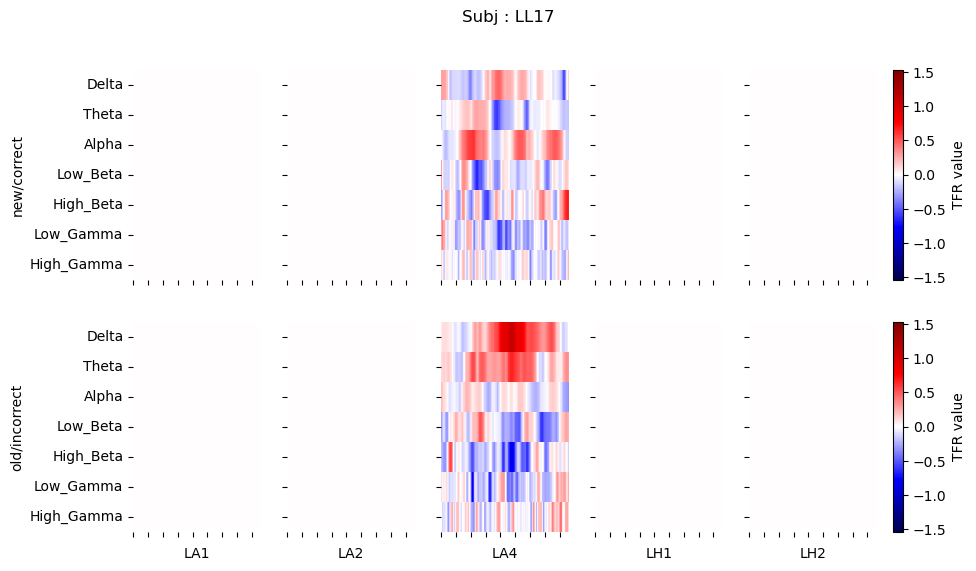

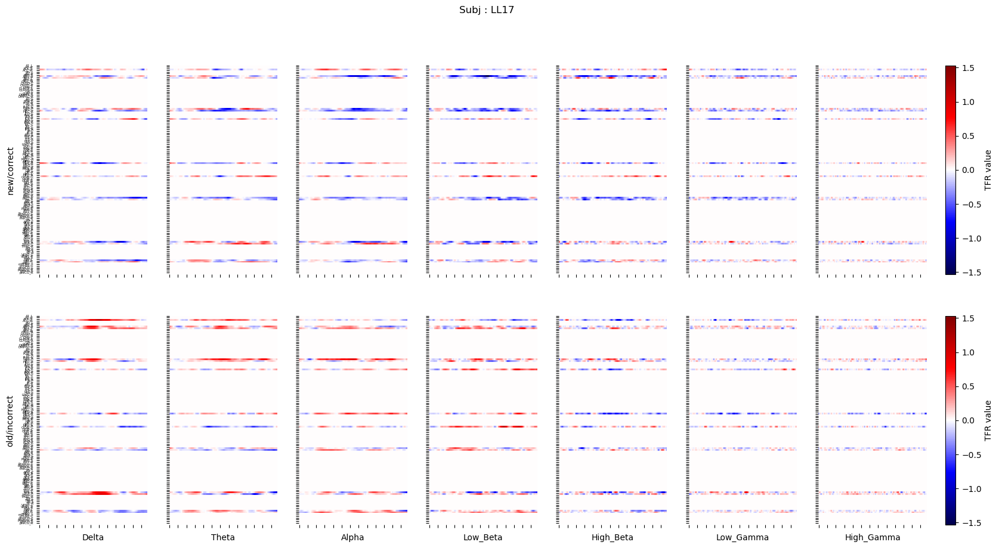

In [9]:
############## Vizualization ###############
print(f'------- {subj} -------')
print(TFRm.shape)
PlotSingleTFRm(TFRm, space_dim=info['chnames'], subj=subj, space_select=info['chnames'][:5], same = 'freqband')
PlotSingleTFRm(TFRm, space_dim=AREA, subj=subj, space_select=[], same = 'area')

#### 1.3 check the process -- PURELY EXPLORATORY

In [ ]:
# take subj 'BJH052' and comput TFR
TFR, info = TFR_pipeline('BJH030', area=AREA, tfr_mea_kwargs={'band' : False, 'event': False, 'area':False}, save=False)
TFR_b, info = TFR_pipeline('BJH030', area=AREA, tfr_mea_kwargs={'band' : True, 'event': False, 'area':False}, save=False)
TFR_be, info = TFR_pipeline('BJH030', area=AREA, tfr_mea_kwargs={'band' : True, 'event': True, 'area':False}, save=False)
TFR_bea, info = TFR_pipeline('BJH030', area=AREA, tfr_mea_kwargs={'band' : True, 'event': True, 'area':True}, save=False)

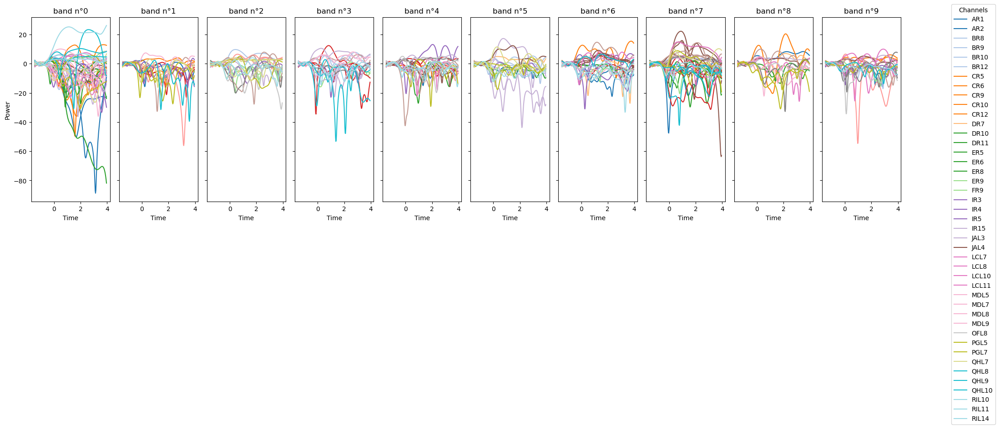

In [11]:
# TFR
fig, ax= plt.subplots(1,len(TFR.freqs[:10]), figsize = (20,5), sharey=True)
ev_id = 0
ch_names = TFR.info['ch_names']
colors = plt.cm.tab20(np.linspace(0, 1, len(ch_names)))  # fixed color map

handles, labels = [], []

for j, band in enumerate(TFR.freqs[:10]):
    for i, ch_name in enumerate(ch_names):
        if abs(TFR.data[ev_id, i, j, :].mean()) > 2:
            h, = ax[j].plot(TFR.times,TFR.data[ev_id, i, j, :],color=colors[i],label=ch_name)
            if j == 0:
                handles.append(h)
                labels.append(ch_name)

    ax[j].set_title(f"band n°{j}")
    ax[j].set_xlabel("Time")
    if j == 0:
        ax[j].set_ylabel("Power")

fig.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.1, 1), title="Channels")
plt.tight_layout()
plt.show()
                      

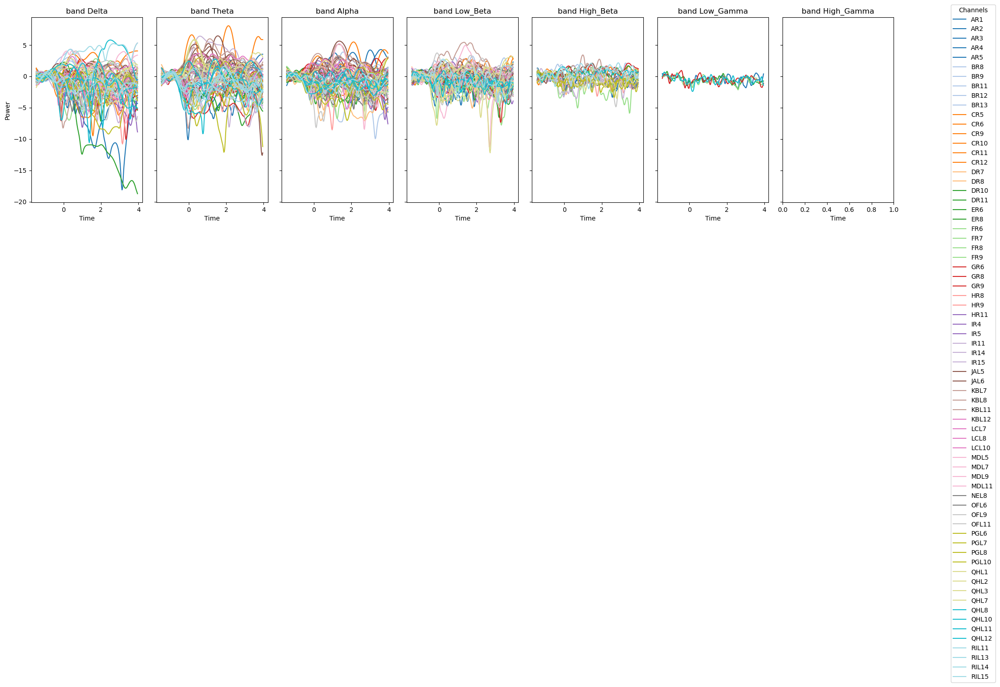

In [12]:
# TFR_b
fig, ax= plt.subplots(1,len(FREQ_BAND.keys()), figsize = (20,5), sharey=True)

ch_names = TFR.info['ch_names']
colors = plt.cm.tab20(np.linspace(0, 1, len(ch_names)))  # fixed color map

handles, labels = [], []

for j, band in enumerate(list(FREQ_BAND.keys())):
    for i, ch_name in enumerate(ch_names):
        if abs(TFR_b[0, i, j, :].mean()) > 0.5:
            h, = ax[j].plot(TFR.times,TFR_b[ev_id, i, j, :],color=colors[i],label=ch_name)
            if j == 0:
                handles.append(h)
                labels.append(ch_name)

    ax[j].set_title(f"band {band}")
    ax[j].set_xlabel("Time")
    if j == 0:
        ax[j].set_ylabel("Power")

fig.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.1, 1), title="Channels")
plt.tight_layout()
plt.show()

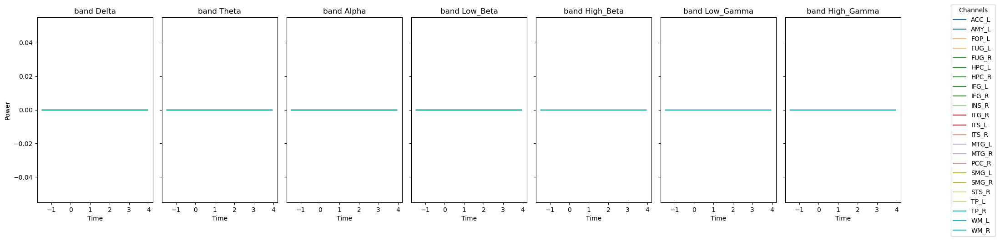

In [13]:
# TFR_bea
fig, ax= plt.subplots(1,len(FREQ_BAND.keys()), figsize = (20,5), sharey=True)

ch_names = AREA
colors = plt.cm.tab20(np.linspace(0, 1, len(ch_names)))  # fixed color map

handles, labels = [], []

for j, band in enumerate(list(FREQ_BAND.keys())):
    for i, ch_name in enumerate(ch_names):
        if abs(TFR_bea[1, i, j, :].mean()) >= 0.1:
            h, = ax[j].plot(TFR.times,TFR_bea[ev_id, i, j, :],color=colors[i],label=ch_name)
            if j == 0:
                handles.append(h)
                labels.append(ch_name)

    ax[j].set_title(f"band {band}")
    ax[j].set_xlabel("Time")
    if j == 0:
        ax[j].set_ylabel("Power")

fig.legend(handles, labels, loc="upper right", bbox_to_anchor=(1.1, 1), title="Channels")
plt.tight_layout()
plt.show()

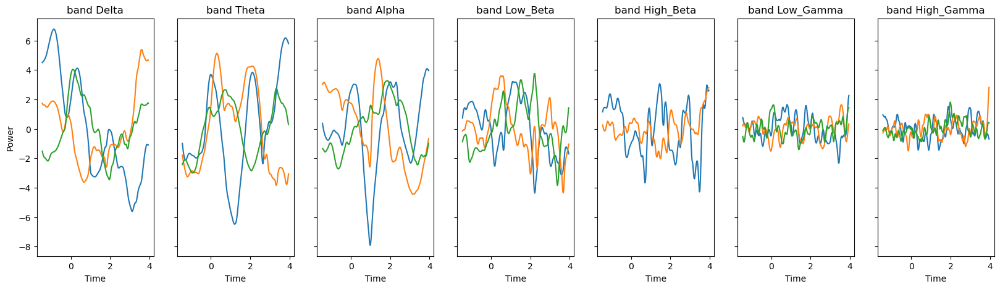

In [22]:
fig, ax= plt.subplots(1,len(FREQ_BAND.keys()), figsize = (20,5), sharey=True)

for j, band in enumerate(list(FREQ_BAND.keys())):   
    # pca on 
    X = TFR_bea[1, :, j, :].T

    # select the best nomber of componants
    df_Nbr_compo = pd.read_csv(OUT_PATH+f'/Nb_compo_pca_bea.csv')
    nb_compo = int(df_Nbr_compo.query("subject == @subj")[list(FREQ_BAND.keys())[j]].values[0])

    # PCA
    pca = PCA(n_components=nb_compo)
    pca.fit(X)

    X_transformed = pca.transform(X)

    for i in range(nb_compo):
        if pca.explained_variance_ratio_[i] >= 0.1:
            h, = ax[j].plot(TFR.times,X_transformed[:, i],label=i)
            if j == 0:
                handles.append(h)
                labels.append(ch_name)

    ax[j].set_title(f"band {band}")
    ax[j].set_xlabel("Time")
    if j == 0:
        ax[j].set_ylabel("Power")

    


In [7]:
out = TFR_pipeline('BJH026', area=AREA, tfr_mea_kwargs={'band' : False, 'event': False, 'area':False}, save=False, summary=True)


Extracting EDF parameters from /users/barbara/Desktop/MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH026/ieeg/sub-BJH026_task-MusicMemory_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading events from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH026/ieeg/sub-BJH026_task-MusicMemory_events.tsv.
Reading channel info from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH026/ieeg/sub-BJH026_task-MusicMemory_channels.tsv.
Reading electrode coords from ../MINDLAB2021_MEG-TempSeqAges/scratch/learning_bach_iEEG/data/BIDS/sub-BJH026/ieeg/sub-BJH026_space-fsaverage_electrodes.tsv.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Used Annotations descriptions: [np.str_('learning_bach_10'), np.str_('learning_bach_20'), np.str_('learning_bach_32'), np.str_('learning_bach_506'), np.str_('learning_bach_97'), np.str_('learning_bach_98'), np.st

/tmp/ipykernel_31996/3455064690.py:23: RuntimeWarning: There are channels without locations (n/a) that are not marked as bad: ['EMPTY', 'EMPTY_2', 'EMPTY_3', 'EMPTY_4', 'REF1', 'REF2', 'EMPTY_63', 'EMPTY_64', 'EMPTY_125', 'EMPTY_126', 'EMPTY_127', 'EMPTY_128', 'EMPTY_163', 'EMPTY_164', 'EMPTY_165', 'EMPTY_166', 'EMPTY_167', 'EMPTY_168', 'EMPTY_169', 'EMPTY_170', 'EMPTY_171', 'EMPTY_172', 'EMPTY_173', 'EMPTY_174', 'EMPTY_175', 'EMPTY_176', 'EMPTY_177', 'EMPTY_178', 'EMPTY_179', 'EMPTY_180', 'EMPTY_181', 'EMPTY_182', 'EMPTY_183', 'EMPTY_184', 'EMPTY_185', 'EMPTY_186', 'EMPTY_187', 'EMPTY_188', 'EMPTY_189', 'EMPTY_190', 'EMPTY_191', 'EMPTY_192', 'EMPTY_193', 'EMPTY_194', 'EMPTY_195', 'EMPTY_196', 'EMPTY_197', 'EMPTY_198', 'EMPTY_199', 'EMPTY_200', 'EMPTY_201', 'EMPTY_202', 'EMPTY_203', 'EMPTY_204', 'EMPTY_205', 'EMPTY_206', 'EMPTY_207', 'EMPTY_208', 'EMPTY_209', 'EMPTY_210', 'EMPTY_211', 'EMPTY_212', 'EMPTY_213', 'EMPTY_214', 'EMPTY_215', 'EMPTY_216', 'EMPTY_217', 'EMPTY_218', 'EMPTY_219'

sEEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=137, n_times=1236861
    Range : 1000 ... 1237860 =      0.500 ...   618.930 secs
Ready.
Added the following bipolar channels:
AL1-AL2, AL2-AL3, AL3-AL4, AL4-AL5, AL5-AL6, AL6-AL7, AL7-AL8, AL8-AL9, AL9-AL10, AL10-AL11, AL11-AL12, AL12-AL13, AL13-AL14, AL14-AL15, AL15-AL16, BL1-BL2, BL2-BL3, BL3-BL4, BL4-BL5, BL5-BL6, BL6-BL7, BL7-BL8, BL8-BL9, BL9-BL10, BL10-BL11, BL11-BL12, BL12-BL13, BL13-BL14, BL14-BL15, BL15-BL16, CL1-CL2, CL2-CL3, CL3-CL4, CL4-CL5, CL5-CL6, CL6-CL7, CL7-CL8, DL1-DL2, DL2-DL3, DL3-DL4, DL4-DL5, DL5-DL6, DL6-DL7, DL7-DL8, DL8-DL9, DL9-DL10, DL10-DL11, DL11-DL12, DL12-DL13, DL13-DL14, DL14-DL15, DL15-DL16, EL1-EL2, EL2-EL3, EL3-EL4, EL4-EL5, EL5-EL6, EL6-EL7, EL7-EL8, EL8-EL9, EL9-EL10, FL1-FL2, FL2-FL3, FL3-FL4, FL4-FL5, FL5-FL6, FL6-FL7, FL7-FL8, FL8-FL9, FL9-FL10, GL1-GL2, GL2-GL3, GL3-GL4, GL4-GL5, GL5-GL6, GL6-GL7, GL7-GL8, HL1-HL2, HL2-HL3, HL3-HL4, HL4-HL5, HL5-HL6, 

/users/barbara/Desktop/MIB/utils.py:214: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw1 = raw1.set_montage(montage,on_missing='warn')


###### Resampling
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 0.1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Filter length: 19801 samples (33.002 s)

###### Filtering line freqs:  [ 60. 120. 180. 240.]
Filtering raw data in 1 contiguous segment
Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3961 samples (6.602 s)

###### Epoching
Not setting metadata
48 matching events foun

/tmp/ipykernel_31996/3455064690.py:68: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/tmp/ipykernel_31996/3455064690.py:68: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/tmp/ipykernel_31996/3455064690.py:68: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],
/tmp/ipykernel_31996/3455064690.py:68: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.Epochs(raw, events, event_id=event_id, tmin=epoching_kwargs['tmin'], tmax=epoching_kwargs['tmax'],


Not setting metadata
22 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
###### Compute TFR
###### Call tfr morlet
NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


/users/barbara/Desktop/MIB/utils.py:351: RuntimeWarning: No matching events found for old/incorrect (event id 101)
  epochs = mne.EpochsArray(norm_data, epochs.info, events=epochs.events, baseline=epochs.baseline,
/users/barbara/Desktop/MIB/utils.py:351: RuntimeWarning: No matching events found for new/incorrect (event id 102)
  epochs = mne.EpochsArray(norm_data, epochs.info, events=epochs.events, baseline=epochs.baseline,
/users/barbara/Desktop/MIB/utils.py:351: RuntimeWarning: No matching events found for old/null (event id 201)
  epochs = mne.EpochsArray(norm_data, epochs.info, events=epochs.events, baseline=epochs.baseline,
/users/barbara/Desktop/MIB/utils.py:351: RuntimeWarning: No matching events found for new/null (event id 202)
  epochs = mne.EpochsArray(norm_data, epochs.info, events=epochs.events, baseline=epochs.baseline,


##### Log transforming
trial  1
trial  2
trial  3
trial  4
trial  5
trial  6
trial  7
trial  8
trial  9
trial  10
trial  11
trial  12
trial  13
trial  14
trial  15
trial  16
trial  17
trial  18
trial  19
trial  20
trial  21
trial  22
##### z-scoring to baseline
#####subtracting baseline per trial
###### Smoothing
###### Mean TFR


/tmp/ipykernel_31996/3455064690.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['label_side'] = df_subset.label +'_' + df_subset.side


#### Q1.4 Get properly the channels

In [9]:
def get_channel_labels(SBJ,channels=[],ref=True,exclude_bads=False,exclude_shaft_end=False):
    ''' Script to obtain anatomical labels for channels of a given subject
    Parameters
    ----------
    SBJ: str
        Subject code
    channels: list of str 
        list of channels to obtain the labels for. If empty, returns all channels for the subject.
    ref: bool
        whether the channels have been re-referenced (bipolar)
    exclude_bads: bool
        whether to exclude bad channels
    exclude_shaft_end: bool
        whether to exclude channels at the end of a shaft after re-referencinc     
    Returns
    ----------
    out_channels: list of channels
    labels: list of labels
    '''
    elec_file = f'{PROJECT_PATH}/misc/electrodes/{SBJ}_electrodes.csv'
    bads_file = f'{PROJECT_PATH}/misc/bad_channels/{SBJ}_bad_channels.csv'

    elec = pd.read_csv(elec_file)
    bads = pd.read_csv(bads_file)
    if len(channels) == 0:
        channels = list(elec['electrode'].values)
    labels, out_channels = [], []
    for ch in channels:
        cchix = np.where(elec['electrode'] == ch)[0]
        include = True
        if (cchix == len(elec['label'].values)-1) or (ref==False):
            clabel = elec.loc[cchix,'label'].values[0]
            if (exclude_bads == True) and (ch in bads['name'].values):
                include = False
        elif ref:
            clabel = elec.loc[cchix+1,'label'].values[0]
            nextch = elec.loc[cchix+1,'electrode'].values[0]

            # Recode electrodes labeled as white matter that are at the border of a region
            if (clabel in ['WM','VENT']) or (re.sub(r'[0-9]','',ch) != re.sub(r'[0-9]','',nextch)):
                clabel = elec.loc[cchix,'label'].values[0]
            
            # Exclude bad channels if requested
            if ((exclude_bads == True) and (ch in bads['name'].values) or
               ((re.sub(r'[0-9]','',ch) == re.sub(r'[0-9]','',nextch)) and (nextch in bads['name'].values))):
               include=False

            # Exclude shaft end if requested
            if ((exclude_shaft_end == True) and 
                ((re.sub(r'[0-9]','',ch) != re.sub(r'[0-9]','',nextch)) or
                 (cchix == len(elec['label'].values)-1))): 
               include = False
        if include == True:
            labels += [clabel]
            out_channels += [ch]


        

    return out_channels, labels

In [31]:
out_channels, labels = get_channel_labels(subj_included[0], exclude_bads=True,exclude_shaft_end=True)

In [32]:
area, area_dict = FindAREA(project_path=PROJECT_PATH, to_exclude=TO_EXCLUDE, subj_list=[subj_included[0]])


In [33]:
area_list = []
for el in area_dict.values() : 
    area_list.extend(el)

In [34]:
len(area_list)

90

In [35]:
len(out_channels)


76

In [36]:
file_name = f'outs/TFR/{subj_included[0]}_TFRm.p'

with open(file_name, "rb") as f:
    TFRm = pickle.load(f)

In [37]:
TFRm.shape

(6, 47, 7, 161)

In [40]:
file_name = op.join(OUT_PATH + '/TFR',subj_included[0] + f'_info.json')
with open(file_name) as json_data:
    info = json.load(json_data)
    json_data.close()

In [41]:
len(info['chnames'])

47

## 2. PCA subj level --> correlation

In [12]:
from utils import CheckPCsNB, RunPCASubjLevel, GetCoordinate, PlotTimeSeries, Heatmap, PlotCompoIndividual, PCCorrelation, VizAllIndividualCompo

INFO : TFRm.shape 
- 127 == area to reduce, 217 time point to keep 
- want compo of shape 5 * 127 
- OUT of shape 217 * 5

#### 2.1 Single level with area

In [12]:
# 1. FIND THE RIGHT NUMBER OF PC FOR EVERY SUBJ EVERY FREQ BAND EVERY EVENTS --- AREA SOLUTIONS
code = 'bea' # mean over 'b'andwidth, trial per 'e'vents, a for area (mean over electrod of the same area)
csv_path = OUT_PATH + f'/subjPCA/Nb_compo_pca_{code}.csv'
all_dfs =[]

for i, subj in enumerate(subj_list) : 
    try : 
        file_name = op.join(OUT_PATH+ '/TFR', subj + f'_TFRm_{code}_LB_0.5_180.0_25_100.p')
        with open(file_name, "rb") as f:
            TFRm = pickle.load(f)
    except : 
        continue

    event_n_zero =[]
    for i in range(TFRm.shape[0]) :
        if not len(np.unique(TFRm[i, :, :, :])) == 1: 
            event_n_zero.append(list(EVENT_ID.keys())[i]) # append the keys of the events
    
        best_compo_nb = pd.DataFrame()

        for event in event_n_zero : 
            event_id = list(EVENT_ID.keys()).index(event)
            best_compo_nb[event] = CheckPCsNB(TFRm, list(EVENT_ID.keys()).index(event), thr_pca=0.8, nb_compo_to_try=20, plot=False)
    
        best_compo_nb.loc['subject', :] = subj

        to_write = best_compo_nb.T.reset_index().rename(columns = {'index' :'event'})

    all_dfs.append(to_write)

final_df = pd.concat(all_dfs, ignore_index=True)
#final_df.to_csv(csv_path, index=False)   

/tmp/ipykernel_5725/4293243670.py:25: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'BJH026' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  best_compo_nb.loc['subject', :] = subj
/tmp/ipykernel_5725/4293243670.py:25: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'BJH026' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  best_compo_nb.loc['subject', :] = subj
/tmp/ipykernel_5725/4293243670.py:25: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'BJH026' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  best_compo_nb.loc['subject', :] = subj
/tmp/ipykernel_5725/4293243670.py:25: FutureWarning: Setting an item of incompatible 

In [13]:
df_Nbr_compo = pd.read_csv(OUT_PATH+f'/subjPCA/Nb_compo_pca_{code}.csv')
df_Nbr_compo

,event,Delta,Theta,Alpha,Low_Beta,High_Beta,Low_Gamma,High_Gamma,subject
0,old/correct,5.0,5.0,5.0,7.0,9.0,10.0,10.0,BJH026
1,new/correct,5.0,5.0,5.0,7.0,8.0,9.0,9.0,BJH026
2,old/correct,3.0,3.0,3.0,3.0,5.0,6.0,6.0,BJH039
3,new/correct,3.0,4.0,5.0,6.0,6.0,7.0,7.0,BJH039
4,old/correct,5.0,4.0,4.0,6.0,6.0,6.0,6.0,BJH041
5,new/correct,4.0,5.0,4.0,6.0,6.0,7.0,7.0,BJH041
6,old/correct,5.0,4.0,5.0,7.0,9.0,9.0,10.0,BJH042
7,new/correct,5.0,5.0,5.0,6.0,8.0,10.0,10.0,BJH042
8,old/correct,5.0,5.0,4.0,7.0,9.0,10.0,10.0,BJH049
9,new/correct,4.0,6.0,5.0,7.0,10.0,11.0,11.0,BJH049


In [14]:
# 2. RUN PCA
df_Componants, df_X_transformed = RunPCASubjLevel(subj_list, nb_compo=2, code='bea', out_path=OUT_PATH + '/TFR')

#for subj, df in df_Componants.items() : 
        #df.to_csv(f'{OUT_PATH}/subjPCA/{subj}_componants_{code}.csv')
#df_X_transformed.to_csv(f'{OUT_PATH}/subjPCA/X_transform_{code}.csv')

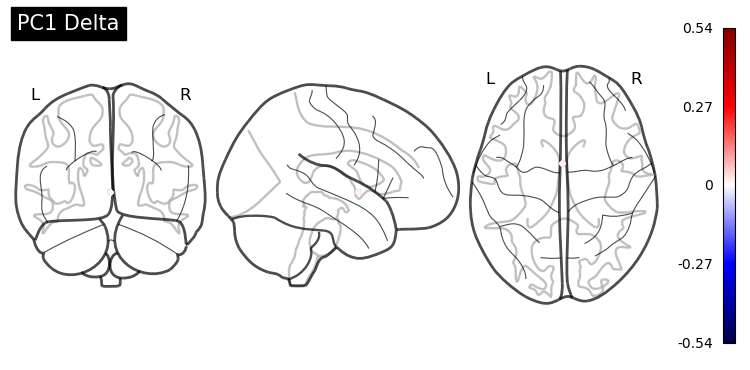

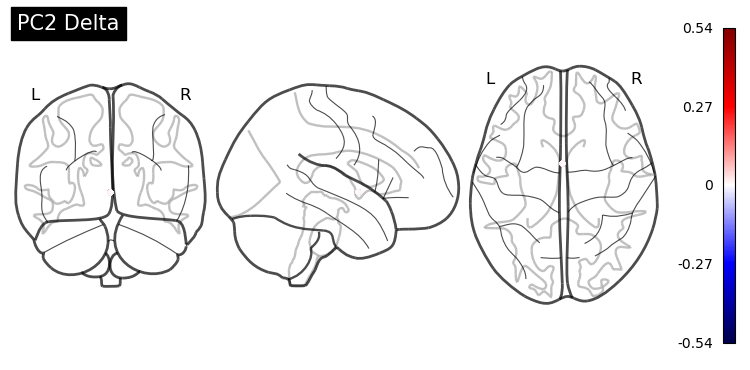

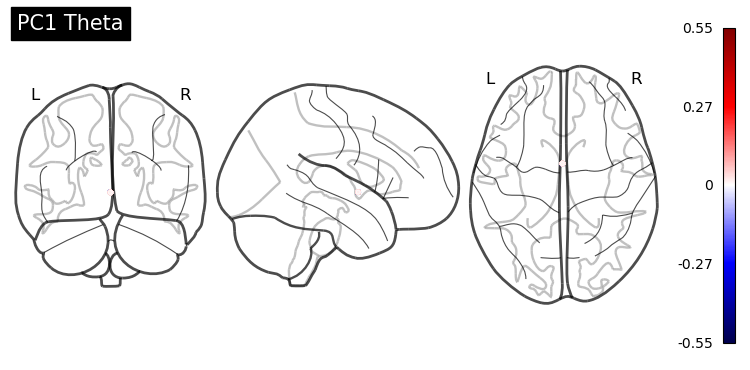

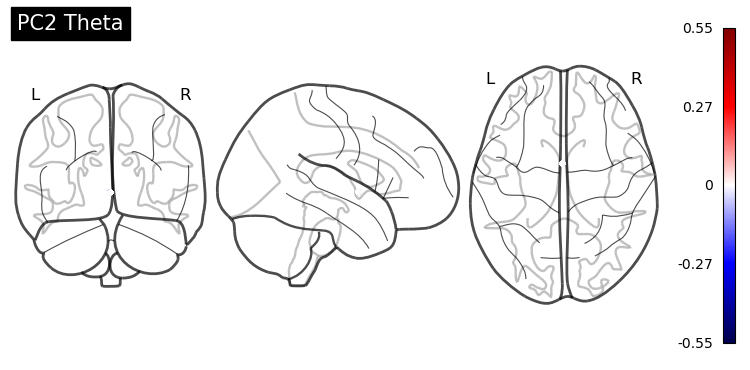

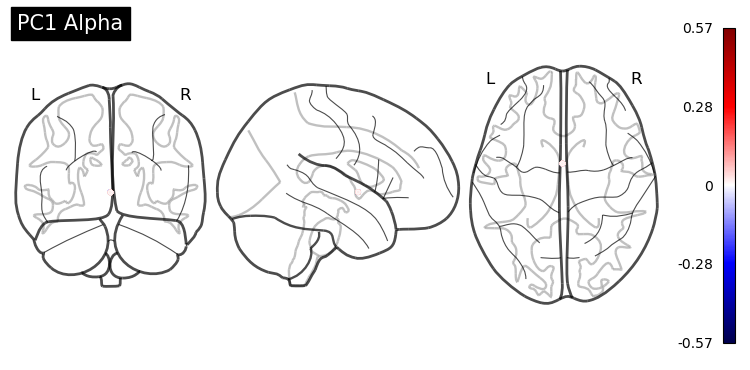

...

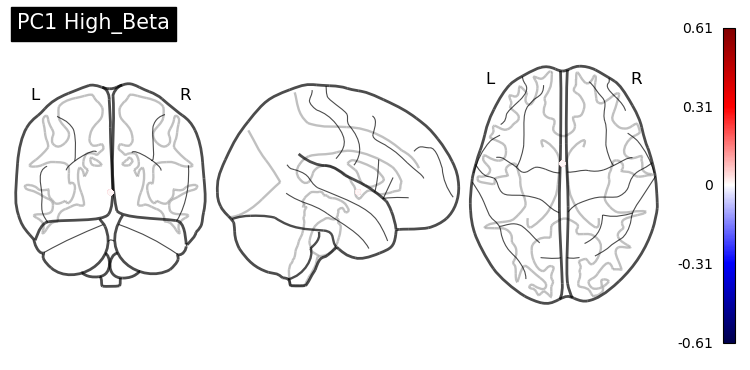

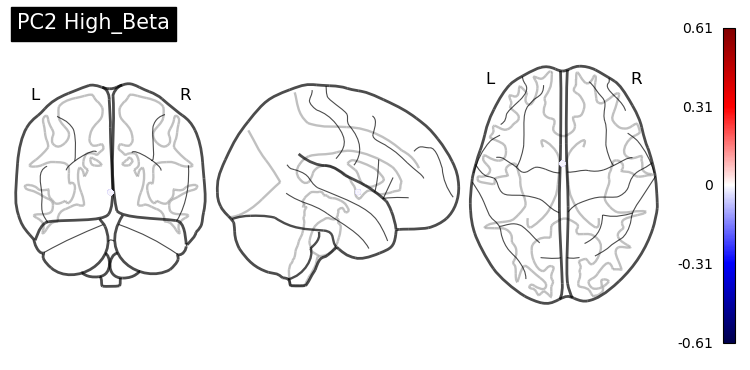

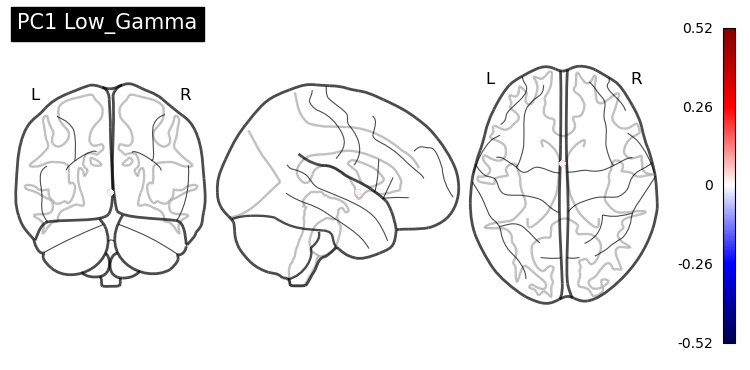

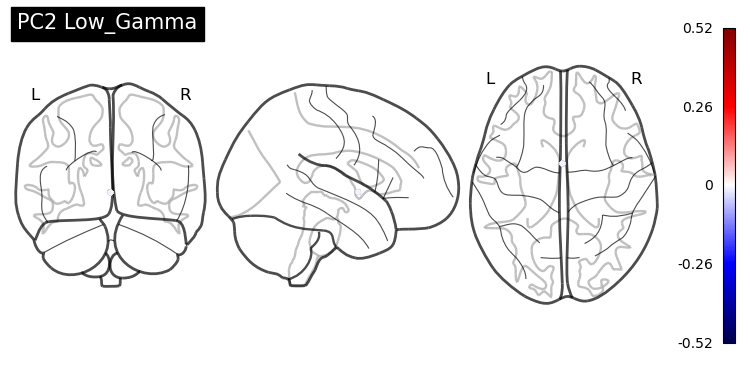

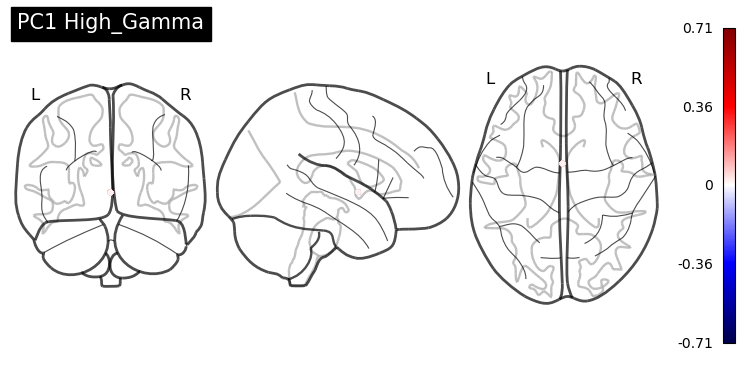

In [15]:
# 3. INSPECT VIZ 
area_dict= GetCoordinate(subj_list=list(df_Componants.keys()))

for subj in np.unique(df_X_transformed.subj.values)[:1] : # ONLY ONE SUBJECT CHECK THE FOLDER TO SEE THE OTHERS
    PlotTimeSeries(subj=subj, df_X_transformed=df_X_transformed, code='bea', save=True)
    Heatmap(subj=subj, df_X_transformed=df_X_transformed, code='bea', save=True)
    PlotCompoIndividual(subj, df_Componants=df_Componants, area_dict=area_dict, save=True, code='bea')

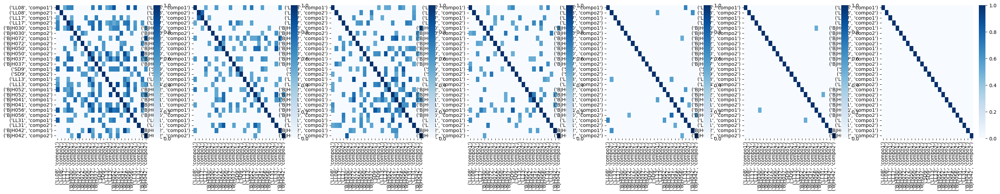

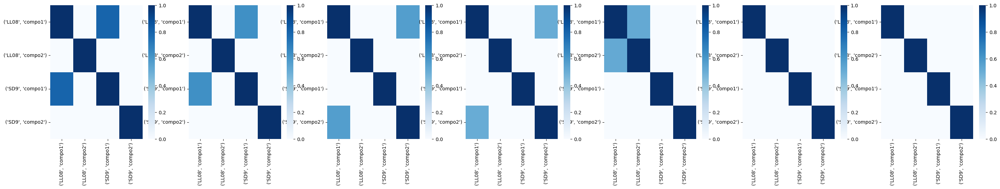

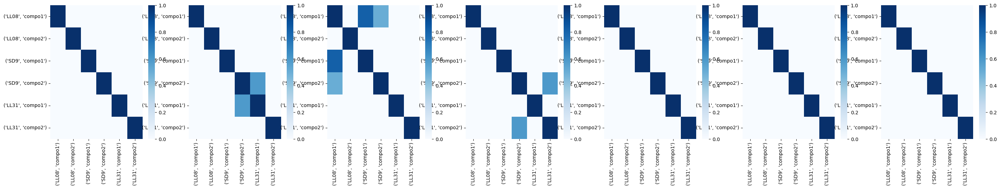

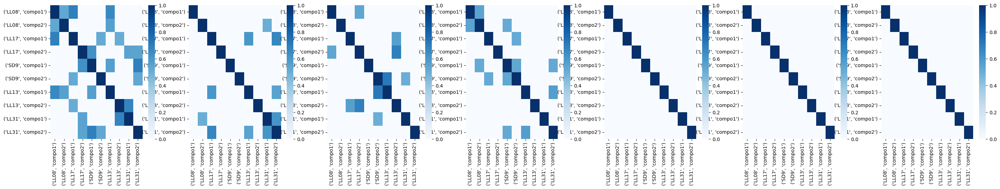

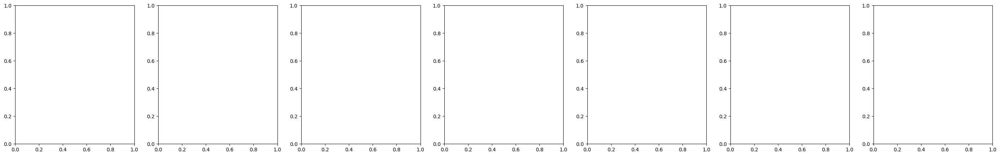

In [37]:
# 4. CORRELATION ON TIME SERIES
corr_df= PCCorrelation(df_X_transformed, code='bea', save=True, thr_plot=0.5, show=False, out_path=OUT_PATH+'/subjPCA/correlationPCs')

#### 2.2 Single subject but keep the electrods

In [ ]:
# 1. FIND THE RIGHT NUMBER OF PC FOR EVERY SUBJ EVERY FREQ BAND EVERY EVENTS --- ELECTRODS SOLUTIONS
code = 'be' # mean over 'b'andwidth, trial per 'e'vents
csv_path = OUT_PATH + '/subjPCA' + f'/Nb_compo_pca_{code}.csv'
all_dfs =[]

for i, subj in enumerate(subj_list) : 
    file_name = op.join(OUT_PATH + '/TFR', subj + f'_TFRm_{code}_LB_0.5_180.0_25_100.p')
    with open(file_name, "rb") as f:
        TFRm = pickle.load(f)
    event_n_zero =[]
    for i in range(TFRm.shape[0]) :
        if not len(np.unique(TFRm[i, :, :, :])) == 1: 
            event_n_zero.append(list(EVENT_ID.keys())[i]) # append the keys of the events
        best_compo_nb = pd.DataFrame()
        for event in event_n_zero : 
            event_id = list(EVENT_ID.keys()).index(event)
            best_compo_nb[event] = CheckPCsNB(TFRm, list(EVENT_ID.keys()).index(event), thr_pca=0.8, nb_compo_to_try=20, plot=True)
        best_compo_nb.loc['subject', :] = subj
        to_write = best_compo_nb.T.reset_index().rename(columns = {'index' :'event'})
    all_dfs.append(to_write)

final_df = pd.concat(all_dfs, ignore_index=True)
#final_df.to_csv(csv_path, index=False)   

In [42]:
df_Nbr_compo = pd.read_csv(OUT_PATH+f'/subjPCA/Nb_compo_pca_{code}.csv')
df_Nbr_compo

,event,Delta,Theta,Alpha,Low_Beta,High_Beta,Low_Gamma,High_Gamma,subject
0,old/correct,7.0,7.0,8.0,10.0,14.0,17.0,19.0,LL08
1,new/correct,6.0,7.0,8.0,10.0,14.0,17.0,18.0,LL08
2,old/incorrect,7.0,7.0,8.0,11.0,14.0,17.0,19.0,LL08
3,new/incorrect,7.0,8.0,8.0,11.0,13.0,17.0,19.0,LL08
4,old/null,7.0,7.0,8.0,10.0,14.0,16.0,18.0,LL08
5,new/correct,6.0,6.0,5.0,7.0,9.0,11.0,13.0,LL17
6,old/incorrect,6.0,6.0,6.0,8.0,10.0,11.0,12.0,LL17
7,new/correct,6.0,7.0,7.0,10.0,16.0,NaN,NaN,BJH030
8,new/correct,6.0,6.0,6.0,8.0,15.0,20.0,NaN,BJH072
9,new/correct,6.0,6.0,7.0,11.0,14.0,17.0,19.0,BJH050


In [ ]:
# 2. RUN PCA
df_Componants, df_X_transformed = RunPCASubjLevel(subj_list, nb_compo=2, code=code, out_path=OUT_PATH + '/TFR')

#for subj, df in df_Componants.items() : 
        #df.to_csv(f'{OUT_PATH}/subjPCA/{subj}_componants_{code}.csv')
#df_X_transformed.to_csv(f'{OUT_PATH}/subjPCA/X_transform_{code}.csv')

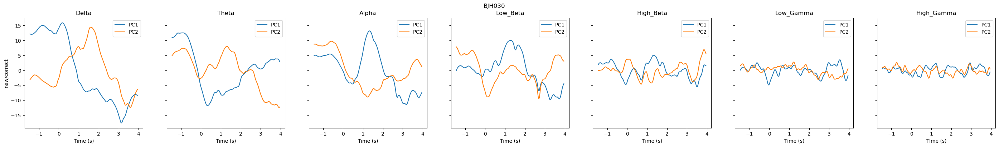

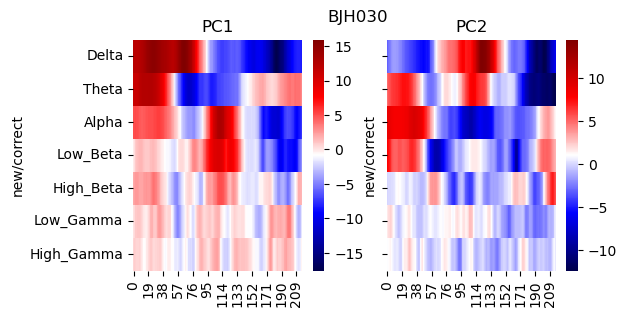

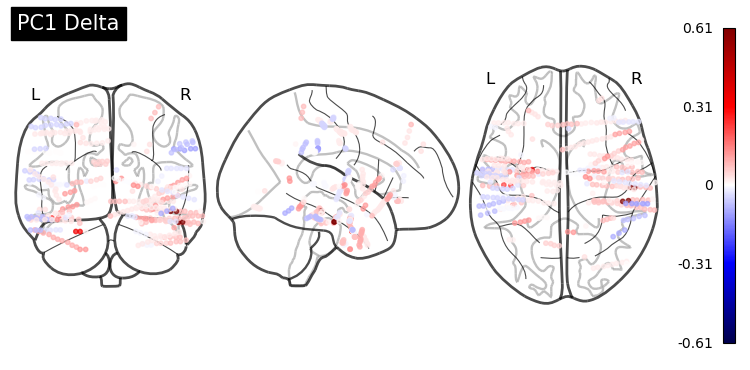

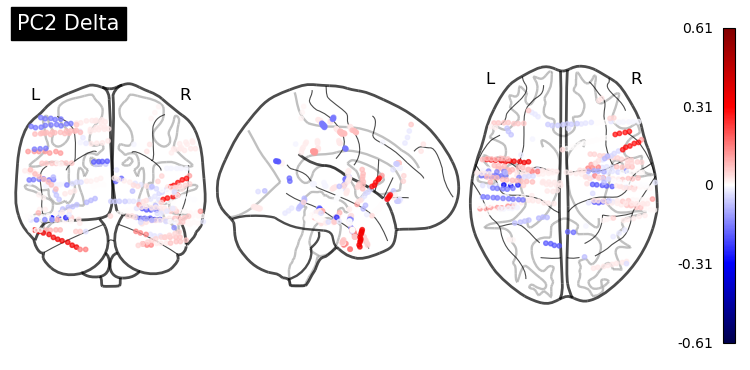

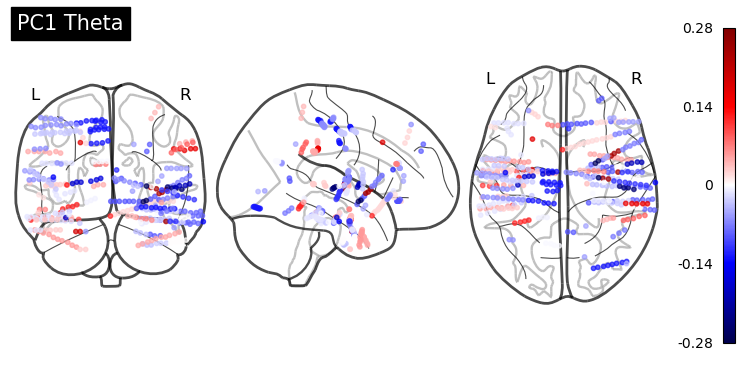

...

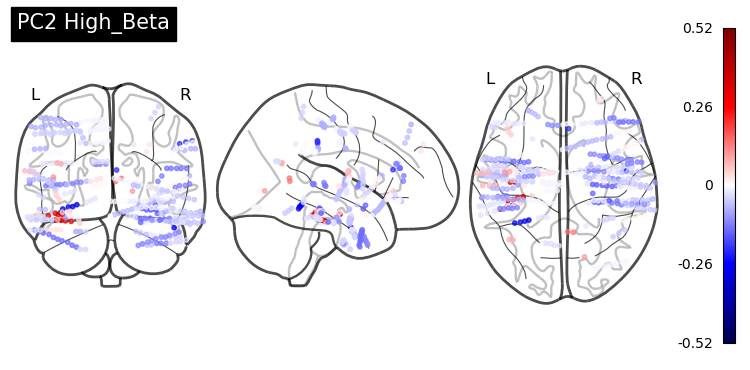

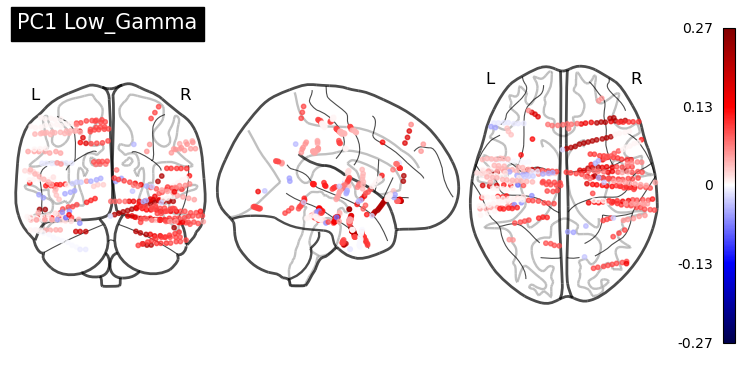

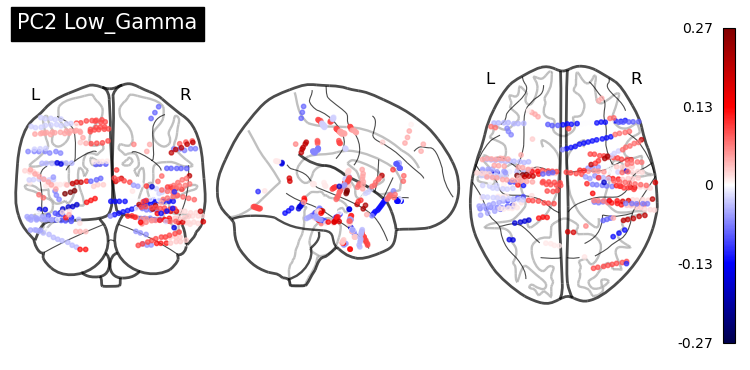

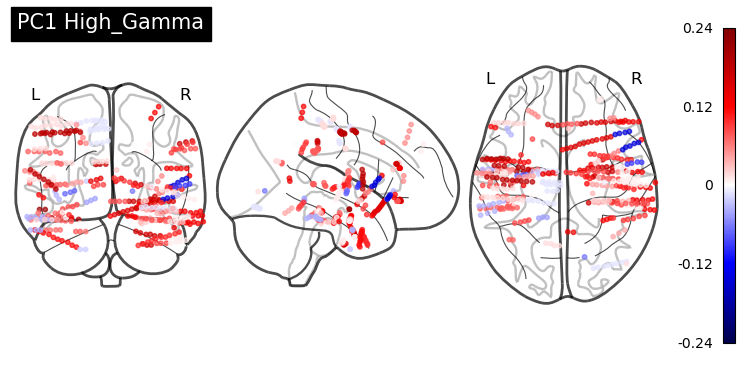

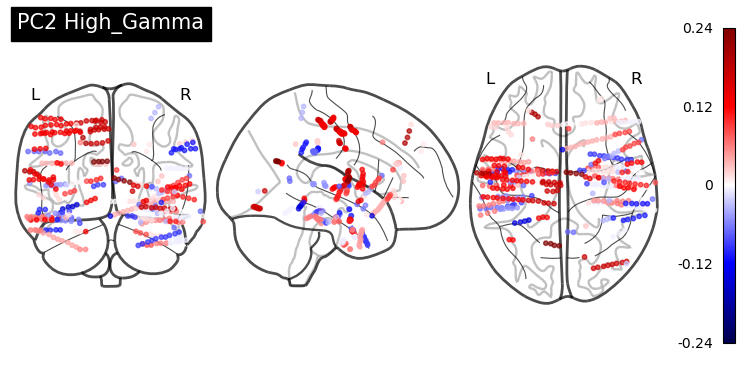

In [47]:
# 3. INSPECT VIZ 
for subj in np.unique(df_X_transformed.subj.values)[:1] :
    PlotTimeSeries(df_X_transformed, subj, show=False, save=True, code=code, out_path=OUT_PATH + '/subjPCA/figures/timeseries')      
    Heatmap(df_X_transformed, subj, show=False, save=True, code = code, out_path=OUT_PATH + '/subjPCA/figures/heatmaps')
    PlotCompoIndividual(subj, df_Componants=df_Componants, area_dict=False, save=True, code=code, out_path = OUT_PATH + '/subjPCA/figures/spatialPCs')   

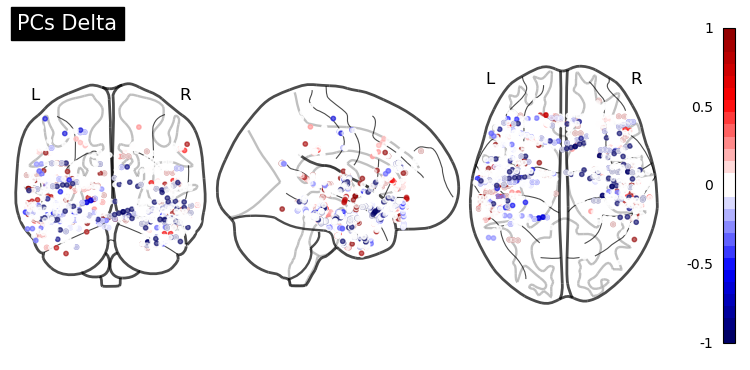

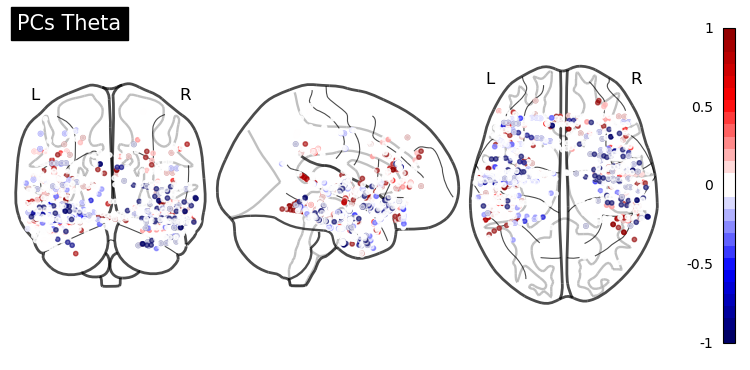

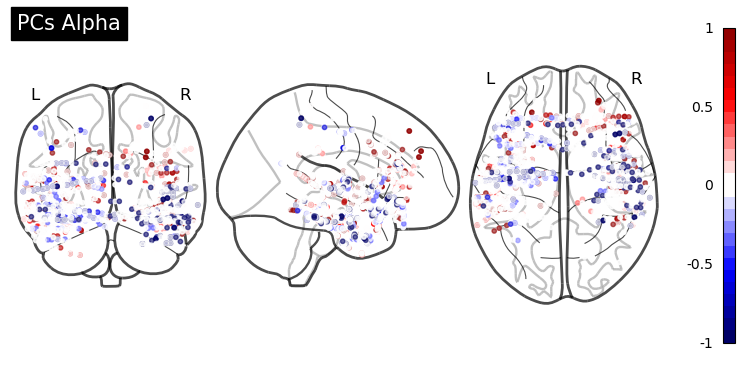

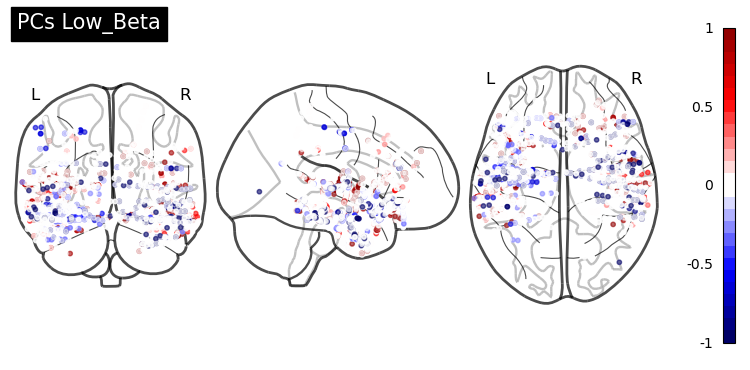

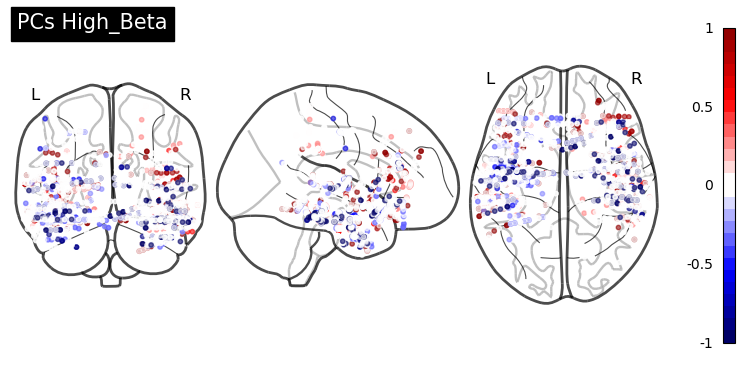

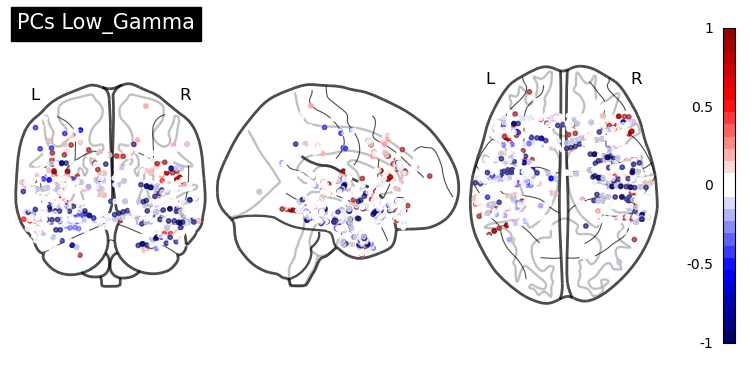

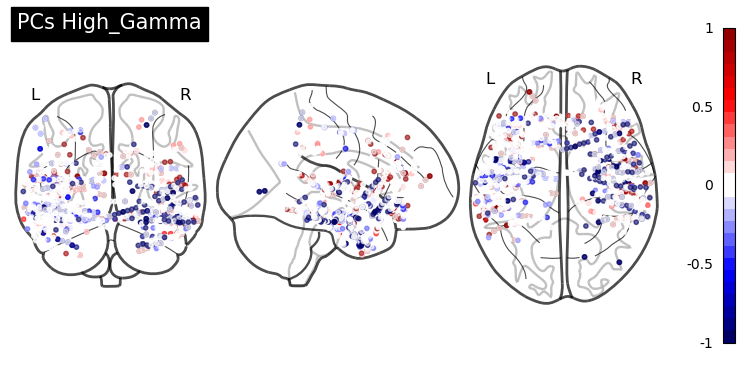

In [61]:
# 4. INSPECT COMPONENT SPATIAL ORGA ACCROSS SUBJ
VizAllIndividualCompo(subj_list, df_Componants, save=True)

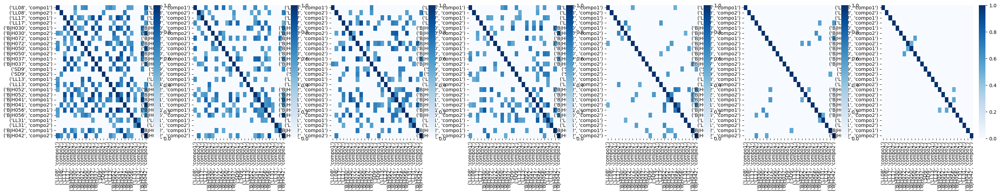

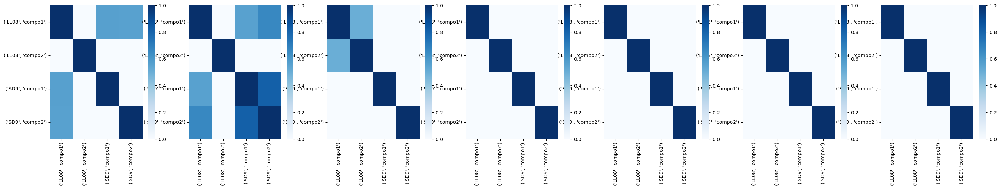

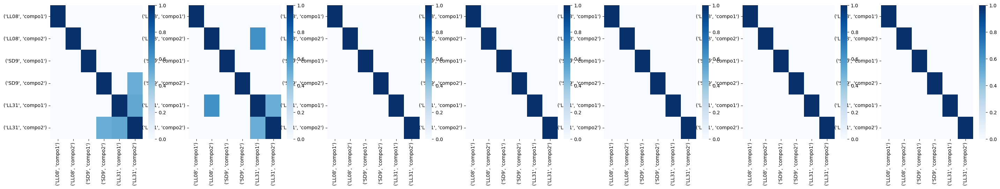

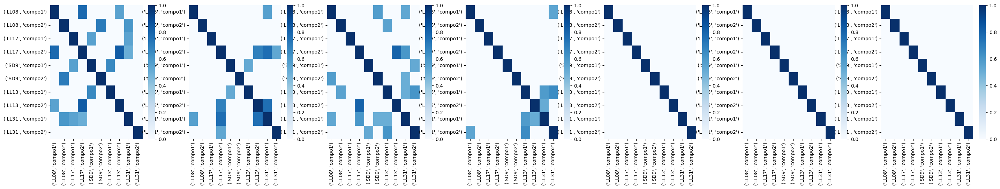

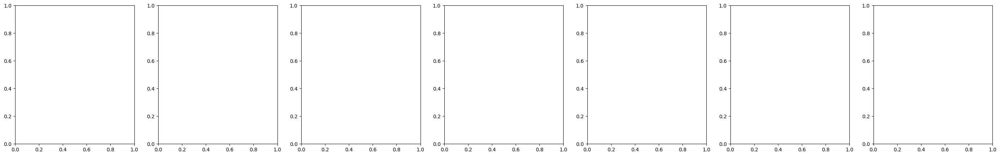

In [62]:
# 5. CORRELATION ON TIME SERIES
df_Spearman = PCCorrelation(df_X_transformed, code, save=True, thr_plot=0.5, show=False)

## 3. Bring it to group level -- PCA on mean or concatenate

In [5]:
from utils import FormatDataSubject, TimeSerieCompo, DotElectrodeCompo, CheckPCsNB, RunPCAGrpLevel
from utils import PlotTimeSeries, Heatmap, GetCoordinate, PlotCompoIndividual

#### 1. Mean on bea

In [7]:
# 0. Set up varraibles
code = 'bea' # mean over 'b'andwidth, trial per 'e'vents, a for area (mean over electrod of the same area)
method = 'mean'
out_path = OUT_PATH + '/grpPCA/' + method + '_' + code
subj_list = [f.replace(f'_TFRm_{code}_LB_0.5_180.0_25_100.p', '') for f in os.listdir(OUT_PATH + '/TFR') if f'_TFRm_{code}_LB_0.5_180.0_25_100.p' in f]

# get the time for the plots - use the first subject as ref
with open(f'{OUT_PATH}/TFR/{subj_list[0]}_info_be.json') as json_data:
    d = json.load(json_data)
    time = d['time']
    json_data.close()

TFRm_all = FormatDataSubject(OUT_PATH + '/TFR',subj_list= subj_list, method=method, code=code)

##### Mean over subject per event
Subject count per event :
new/correct 17
new/incorrect 3
new/null 1
old/correct 17
old/incorrect 5
old/null 2


In [8]:
# 1. Check the number of PCs needed 
event_n_zero =[]
for i in range(TFRm_all.shape[0]) : # accross events
    if not len(np.unique(TFRm_all[i, :, :, :])) == 1: 
        event_n_zero.append(list(EVENT_ID.keys())[i]) # append the keys of the events

best_compo_nb = pd.DataFrame()
for event in event_n_zero : 
    best_compo_nb[event] = CheckPCsNB(TFRm_all, list(EVENT_ID.keys()).index(event), thr_pca=0.8, nb_compo_to_try=20, plot=False)
best_compo_nb.to_csv(out_path + f'/Nb_compo_pca_{method}.csv')

In [9]:
# 2. Run PCs
df_Componants, df_X_transformed = RunPCAGrpLevel(TFRm_all,time, compo_nb = 2, freq_band = FREQ_BAND, events = EVENT_ID)
# 3. Viz 
PlotTimeSeries(df_X_transformed, 'grp', show=False, save=True, code=code, out_path=out_path)
Heatmap(df_X_transformed, 'grp', show=False, save=True, code =code, out_path=out_path)   
area_dict = GetCoordinate(subj_list=subj_included)
PlotCompoIndividual('grp', df_Componants={'grp' : df_Componants}, area_dict=area_dict, save=True, code=code, out_path = out_path) 

#### 2. SuperSubj on be

In [6]:
# 0. Set up varraibles
code = 'be' # mean over 'b'andwidth, trial per 'e'vents
method = 'aggre_elec'
out_path = OUT_PATH + '/grpPCA/' + method + '_' + code
subj_list = [f.replace(f'_TFRm_{code}_LB_0.5_180.0_25_100.p', '') for f in os.listdir(OUT_PATH + '/TFR') if f'_TFRm_{code}_LB_0.5_180.0_25_100.p' in f]

if not os.path.isdir(out_path) : 
    os.makedirs(out_path)
    
# get the time for the plots - use the first subject as ref
with open(f'{OUT_PATH}/TFR/{subj_list[0]}_info_be.json') as json_data:
    d = json.load(json_data)
    time = d['time']
    json_data.close()

TFRm_all = FormatDataSubject(OUT_PATH + '/TFR',subj_list= subj_list, method=method, code=code)
TFRm_all.shape

##### Subject aggregation along observations (electrodes)


(6, 1279, 7, 217)

In [7]:
# 1. Check the number of PCs needed 
event_n_zero =[]
for i in range(TFRm_all.shape[0]) : # accross events
    if not len(np.unique(TFRm_all[i, :, :, :])) == 1: 
        event_n_zero.append(list(EVENT_ID.keys())[i]) # append the keys of the events

best_compo_nb = pd.DataFrame()
for event in event_n_zero : 
    best_compo_nb[event] = CheckPCsNB(TFRm_all, list(EVENT_ID.keys()).index(event), thr_pca=0.8, nb_compo_to_try=20, plot=False)
best_compo_nb.to_csv(out_path + f'/Nb_compo_pca_{method}.csv')

In [8]:
# 2. Run PCs
df_Componants, df_X_transformed = RunPCAGrpLevel(TFRm_all,time, compo_nb = 2, freq_band = FREQ_BAND, events = EVENT_ID)

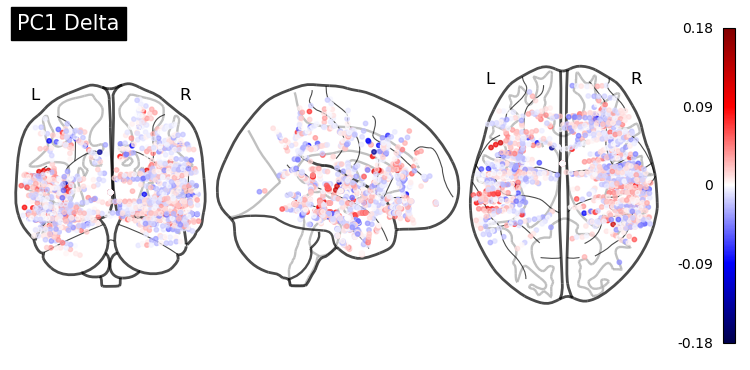

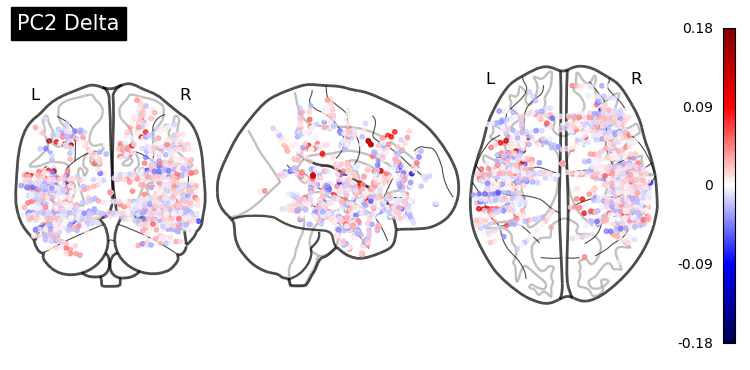

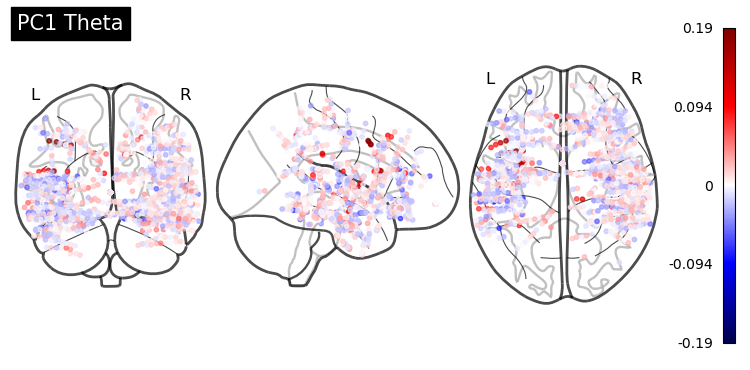

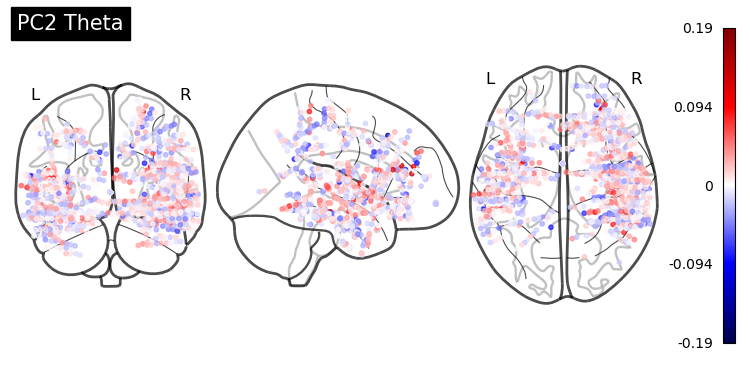

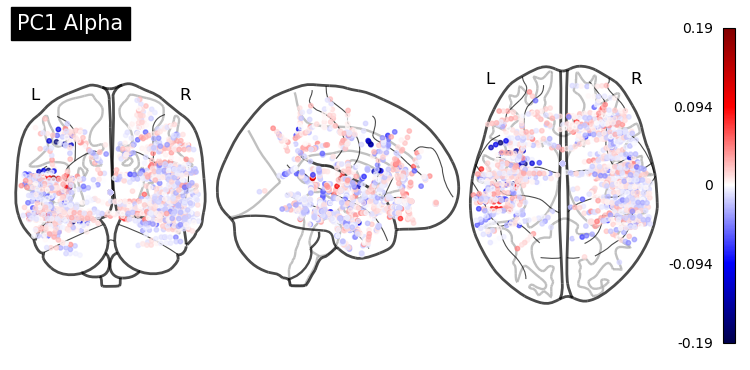

...

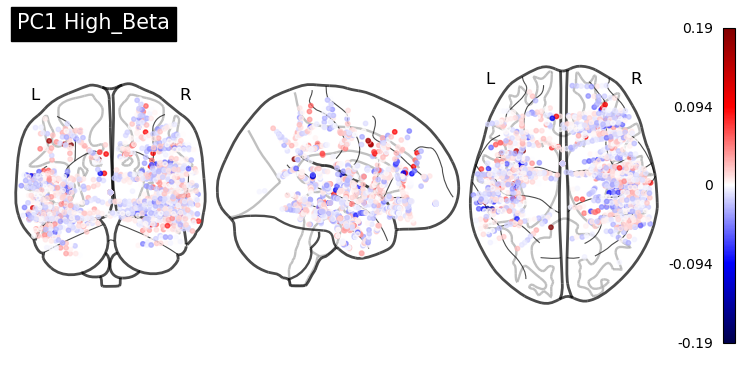

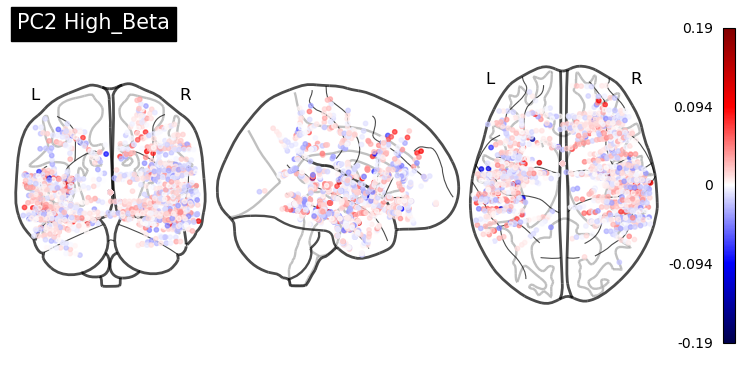

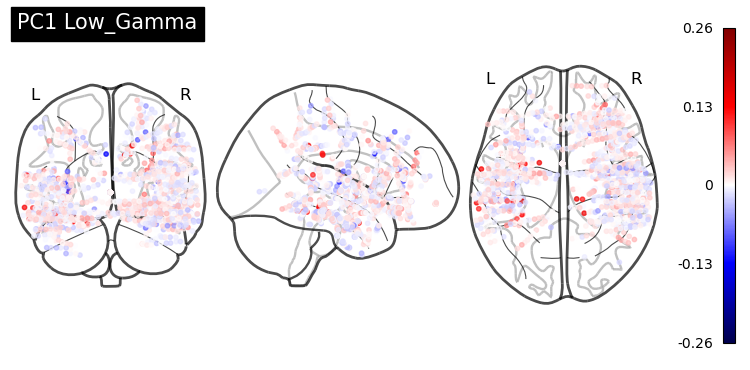

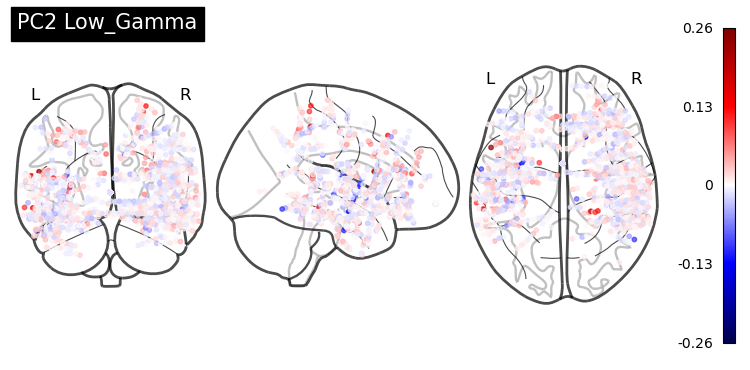

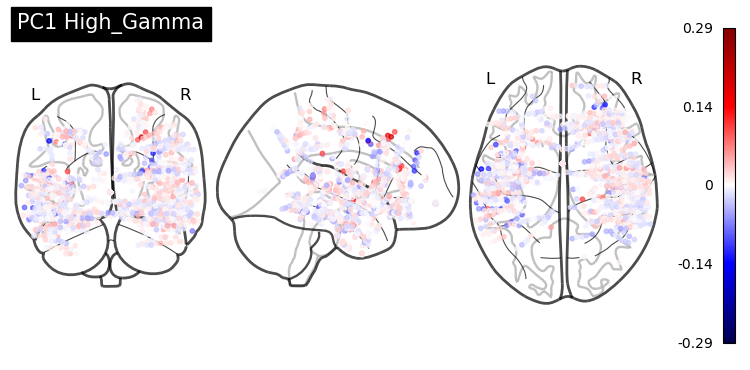

In [9]:
# 3. Viz 
PlotTimeSeries(df_X_transformed, 'grp', show=False, save=True, code=code, out_path=out_path)
Heatmap(df_X_transformed, 'grp', show=False, save=True, code =code, out_path=out_path)   
PlotCompoIndividual('grp', df_Componants={'grp' : df_Componants}, area_dict=False, save=True, code=code, out_path = out_path) 

In [6]:
# TAKE THE TFR
import pickle
file_name = 'outs/TFR/BJH026_TFRm.p'
with open(file_name, "rb") as f:
    TFRm = pickle.load(f)


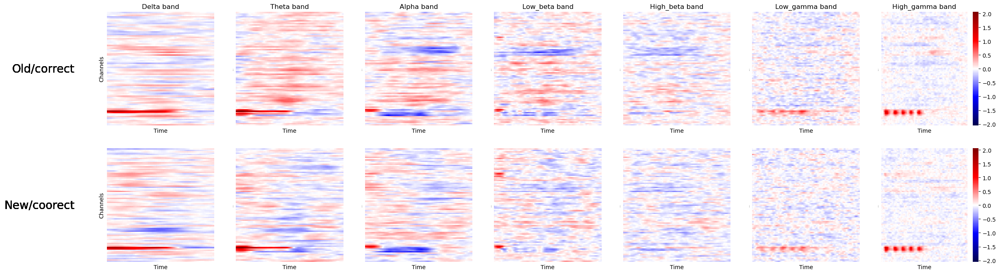

In [7]:
from utils import FREQ_BAND
import seaborn as sns 
vmax = np.abs(TFRm).max()
vmin = -vmax

fig, ax= plt.subplots(2, len(FREQ_BAND), figsize=(4*len(FREQ_BAND), 8))
for freq_i, freq in enumerate(FREQ_BAND) : 
    sns.heatmap(TFRm[0, :, freq_i, :], ax = ax[0][freq_i], cmap='seismic', cbar=freq_i==len(FREQ_BAND)-1, xticklabels=False,yticklabels=False, center=0,vmin=vmin,vmax=vmax)
    sns.heatmap(TFRm[1, :, freq_i, :], ax = ax[1][freq_i], cmap='seismic', cbar=freq_i==len(FREQ_BAND)-1, xticklabels=False, yticklabels=False, center=0,vmin=vmin,vmax=vmax,)
    ax[0][freq_i].set_title(f'{freq.capitalize()} band', fontsize=12)
    ax[0][freq_i].set_xlabel('Time', fontsize=10)
    ax[1][freq_i].set_xlabel('Time', fontsize=10)
    ax[0][freq_i].set_ylabel('Channels', fontsize=10 if freq_i==0 else 0)
    ax[1][freq_i].set_ylabel('Channels', fontsize=10 if freq_i==0 else 0)

    ax[0][0].text(
                -0.3, 0.5, 'Old/correct',
                rotation=0, va='center', ha='right', fontsize=20,
                transform=ax[0][0].transAxes
            )
    
    ax[1][0].text(
                -0.3, 0.5, 'New/coorect',
                rotation=0, va='center', ha='right', fontsize=20,
                transform=ax[1][0].transAxes
            )


    
